#**Introduction**

For this capstone, I will be performing clustering techniques on NFL players by position: Quarterback, Runningback, and Wide Receiver. The 2020 NFL season is fast approaching, and for fantasy football enthusiasts, deciding who to place on your team is of the upmost importance. 

With this analysis, I will be using the 2019 NFL statistics downloaded from FantasyPros to cluster each NFL player into "tiers" based on their 2019 performance. In this manner, I can determine which players are best to choose for my own team. I also modified the dataset by including two very important statistics: 'Games Played' and 'Fantasy Points Scored per Game'. These two stats were not included in the original dataset, so I took it upon myself to include them.  


There are several assumptions I will be working with for each dataset. For one, I will only work with players who played in 2019 because I'd like to cluster players who have already played an NFL game. This does exclude incoming rookies and untested new starters, but since those players are untested and they have no real impact so far, it would be unfair to include them among the players who have demonstrated their play-making ability in the NFL. 

Secondly, there are also players who have played in 2019 who are no longer on a team (known in the data as a free agent (FA)). If you are a player without a team, it is impossible to have any fantasy football impact. Thus, at the time of conducting this analysis, if any player is not on team, no matter well they performed in 2019, I will have to drop them from the dataset. 

With that said, I will be arbitrarily starting with quarterbacks, then moving on to runningbacks, and then concluding with an analysis of wide receivers.

##Hypothesis

Given a group of players, I can use clustering algorithms to cluster players based on their performance. After doing so, I should be able to determine which players are better to have on my fantasy football team.

##Loading and Importing Libraries

Here, I will import most of the libraries we will be using throughout the research project. Some libraries may be missing and introduced later in the project.

In [ ]:
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
from sqlalchemy import create_engine
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings("ignore")

#Quarterbacks 

Our first analysis will be on quarterbacks, the single most influential position in the NFL. Although it can be easier to find an adequate quarterback for a fantasy football team than other positions, such as runningback or wide receiver, it is still advantageous to know which quarterbacks will give a team the edge it needs to win the league. 

##Importing the Data

Reading and transforming dataset in a pandas DataFrame from a csv file, along with basic information of the dataset. My first analysis will focus on Quarterbacks. 

In [ ]:
qb_df = pd.read_csv('https://raw.githubusercontent.com/NehemiahSolis/NFL-Fantasy-Football-Rankings/master/qb_stats_and_projections.csv')
qb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           124 non-null    int64  
 1   PLAYER NAME          124 non-null    object 
 2   TEAM NAME            124 non-null    object 
 3   PLAYER POSITION      124 non-null    object 
 4   2019 COMPLETED PASS  72 non-null     float64
 5   2019 ATTEMPTED PASS  72 non-null     float64
 6   2019 PASSING YDS     72 non-null     float64
 7   2019 PASSING TD      72 non-null     float64
 8   2019 INT             72 non-null     float64
 9   2019 CAR             72 non-null     float64
 10  2019 RUSH YDS        72 non-null     float64
 11  2019 RUSH TD         72 non-null     float64
 12  GAMES PLAYED         72 non-null     float64
 13  FPTS/GM              72 non-null     float64
 14  2019 FPTS            72 non-null     float64
 15  2020 COMPLETED PASS  64 non-null     flo

Here, we see that the data is split in between historical and projection data. For this clustering analysis, I will focus on only the historical data, with the projected fantasy points for those players with historical data.

In [ ]:
qb_df.columns

Index(['Unnamed: 0', 'PLAYER NAME', 'TEAM NAME', 'PLAYER POSITION',
       '2019 COMPLETED PASS', '2019 ATTEMPTED PASS', '2019 PASSING YDS',
       '2019 PASSING TD', '2019 INT', '2019 CAR', '2019 RUSH YDS',
       '2019 RUSH TD', 'GAMES PLAYED', 'FPTS/GM', '2019 FPTS',
       '2020 COMPLETED PASS', '2020 ATTEMPTED PASS', '2020 PASSING YDS',
       '2020 PASSING TD', '2020 INT', '2020 CAR', '2020 RUSH YDS',
       '2020 RUSH TD', '2020 FPTS', '2020 OUTLOOK'],
      dtype='object')

In [ ]:
qb_df.head()

,Unnamed: 0,PLAYER NAME,TEAM NAME,PLAYER POSITION,2019 COMPLETED PASS,2019 ATTEMPTED PASS,2019 PASSING YDS,2019 PASSING TD,2019 INT,2019 CAR,2019 RUSH YDS,2019 RUSH TD,GAMES PLAYED,FPTS/GM,2019 FPTS,2020 COMPLETED PASS,2020 ATTEMPTED PASS,2020 PASSING YDS,2020 PASSING TD,2020 INT,2020 CAR,2020 RUSH YDS,2020 RUSH TD,2020 FPTS,2020 OUTLOOK
0,1,Lamar Jackson,Ravens,QB,265.0,401.0,3127.0,36.0,6.0,176.0,1206.0,7.0,15.0,27.712000,415.68,296.0,465.0,3425.0,25.0,10.0,156.0,902.0,6.0,338.23,The 2019 NFL MVP is fresh off a breakout seaso...
1,2,Patrick Mahomes,Chiefs,QB,319.0,484.0,4031.0,26.0,5.0,43.0,218.0,2.0,14.0,20.502857,287.04,364.0,557.0,4465.0,32.0,10.0,61.0,280.0,3.0,332.66,Patrick Mahomes is 24 years old and has 36 NFL...
2,3,Deshaun Watson,Texans,QB,333.0,495.0,3852.0,26.0,12.0,82.0,413.0,7.0,15.0,21.398667,320.98,337.0,517.0,4018.0,27.0,12.0,87.0,519.0,4.0,314.06,Watson enters his fourth NFL season fresh off ...
3,4,Dak Prescott,Cowboys,QB,388.0,596.0,4902.0,30.0,11.0,52.0,277.0,3.0,16.0,21.111250,337.78,350.0,543.0,4280.0,27.0,11.0,49.0,248.0,4.0,301.71,Prescott will be back under center for Dallas ...
4,5,Russell Wilson,Seahawks,QB,341.0,516.0,4110.0,31.0,5.0,75.0,342.0,3.0,16.0,20.537500,328.60,300.0,473.0,3692.0,29.0,9.0,73.0,397.0,2.0,293.96,The 2019 season was a tale of two halves for W...


The '2020 Outlook' columns consists of expert opinions on the player's projected performance for the upcoming football season. This isn't relevant for any clustering techniques, so I'll drop that column. As mentioned before, I'll also drop the 2020 projection stats. This is because I only want to focus on historical data. I'll also drop the projected rank, position, and team name from the DataFrame because they also aren't relevant and we know we are only working with quarterbacks

In [ ]:
qb_df.drop(columns=['2020 COMPLETED PASS','2020 ATTEMPTED PASS','2020 PASSING YDS','2020 PASSING TD',
                    '2020 INT','2020 CAR','2020 RUSH YDS','2020 RUSH TD','2020 OUTLOOK',
                    'TEAM NAME','PLAYER POSITION','Unnamed: 0'],inplace=True)

Now we can make our columns easier to work with by renaming them

In [ ]:
qb_df.rename(columns={'PLAYER NAME':'player','2019 COMPLETED PASS':'pass_completions','2019 ATTEMPTED PASS':'pass_attempts',
                      '2019 PASSING YDS':'pass_yds','2019 PASSING TD':'td_pass','2019 INT':'interceptions',
                      '2019 CAR':'carries','2019 RUSH YDS':'rush_yds','2019 RUSH TD':'td_rush','GAMES PLAYED':'no_games',
                      'FPTS/GM':'fpts_per_game','2019 FPTS':'fpts','2020 FPTS':'proj_fpts'},inplace=True)

##Exploratory Data Analysis

With our data sorted out, let's take a quick look at the new DataFrame

In [ ]:
qb_df.head()

,player,pass_completions,pass_attempts,pass_yds,td_pass,interceptions,carries,rush_yds,td_rush,no_games,fpts_per_game,fpts,proj_fpts
0,Lamar Jackson,265.0,401.0,3127.0,36.0,6.0,176.0,1206.0,7.0,15.0,27.712000,415.68,338.23
1,Patrick Mahomes,319.0,484.0,4031.0,26.0,5.0,43.0,218.0,2.0,14.0,20.502857,287.04,332.66
2,Deshaun Watson,333.0,495.0,3852.0,26.0,12.0,82.0,413.0,7.0,15.0,21.398667,320.98,314.06
3,Dak Prescott,388.0,596.0,4902.0,30.0,11.0,52.0,277.0,3.0,16.0,21.111250,337.78,301.71
4,Russell Wilson,341.0,516.0,4110.0,31.0,5.0,75.0,342.0,3.0,16.0,20.537500,328.60,293.96


Sweet, everything looks to be in order. Next, I always want to check for any missing values

In [ ]:
qb_df.isnull().sum()

player               0
pass_completions    52
pass_attempts       52
pass_yds            52
td_pass             52
interceptions       52
carries             52
rush_yds            52
td_rush             52
no_games            52
fpts_per_game       52
fpts                52
proj_fpts           60
dtype: int64

Awesome, there are some missing values. As briefly mentioned before, a lot of this data included projections. This includes incoming rookie players or new starters who have no historical data. It also includes players who didn't play a single snap. Since I'll be building models on historical data, I can safely drop data with missing values, as these are the players will no historical data. In the *proj_fpts* column, there are also 60 missing values. These are the players who are free agents or are not going to play in the 2020 season. I will also be dropping these players as they aren't relevant when deciding which players to have on a fantasy football team.

In [ ]:
qb_df.dropna(inplace=True)
qb_df.isnull().sum()

player              0
pass_completions    0
pass_attempts       0
pass_yds            0
td_pass             0
interceptions       0
carries             0
rush_yds            0
td_rush             0
no_games            0
fpts_per_game       0
fpts                0
proj_fpts           0
dtype: int64

Now, let's look at the statistic information for each feature

In [ ]:
qb_df.describe()

,pass_completions,pass_attempts,pass_yds,td_pass,interceptions,carries,rush_yds,td_rush,no_games,fpts_per_game,fpts,proj_fpts
count,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000
mean,206.326923,323.269231,2354.615385,14.673077,7.076923,32.942308,141.961538,1.519231,10.461538,12.566140,159.092308,152.230769
std,140.989323,219.459149,1647.045878,11.127992,6.252360,32.377318,201.245042,2.043549,5.304314,6.755690,118.264934,119.864790
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-5.000000,0.000000,2.000000,-0.546667,-1.640000,8.530000
25%,50.000000,88.500000,578.000000,3.000000,2.000000,9.000000,22.250000,0.000000,4.750000,8.310000,31.175000,14.610000
50%,268.000000,389.500000,2960.500000,17.500000,5.500000,26.500000,71.000000,1.000000,12.500000,14.518500,195.990000,209.495000
75%,326.750000,513.750000,3833.250000,24.000000,11.250000,46.000000,199.250000,2.000000,15.250000,17.280625,247.370000,257.510000
max,408.000000,626.000000,5109.000000,36.000000,30.000000,176.000000,1206.000000,9.000000,16.000000,27.712000,415.680000,338.230000


We can see that the feature set has a wide range of values and scales. For clustering algorithms, I'll want to apply the scaler to the dataset to standardize the variables. This is because many of the algorithms are sensitive to scale.

As a way to become familiar with our data, let's take a look at which features correlate the strongest with the amount of fantasy points a player scores.

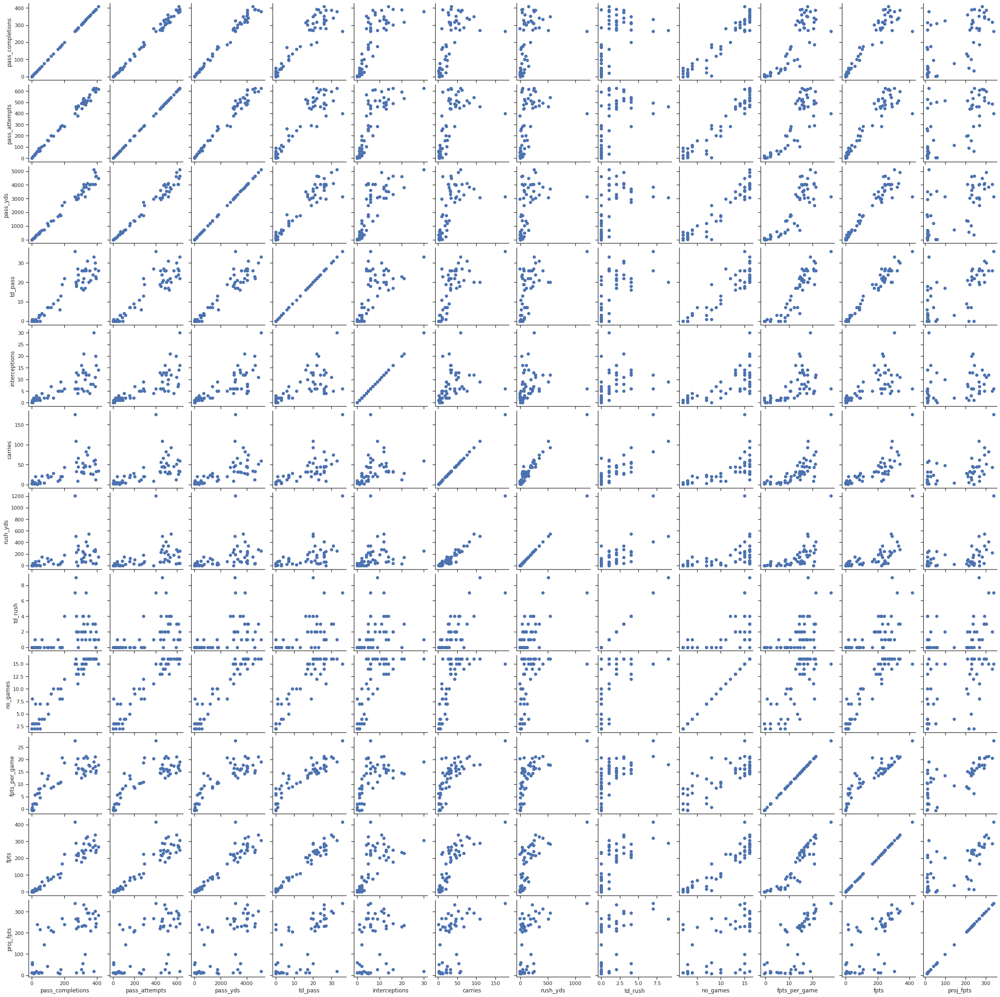

In [ ]:
sns.set(style="ticks")

g = sns.PairGrid(qb_df)
g.map(plt.scatter);

From a glance, it looks like most of the features have a positive correlation with the target (fpts). This indicates that we can move forward with the analysis using all the features. Now, let's take a look at the correlation plot to get a sense of the strength of correlation between features and the target.

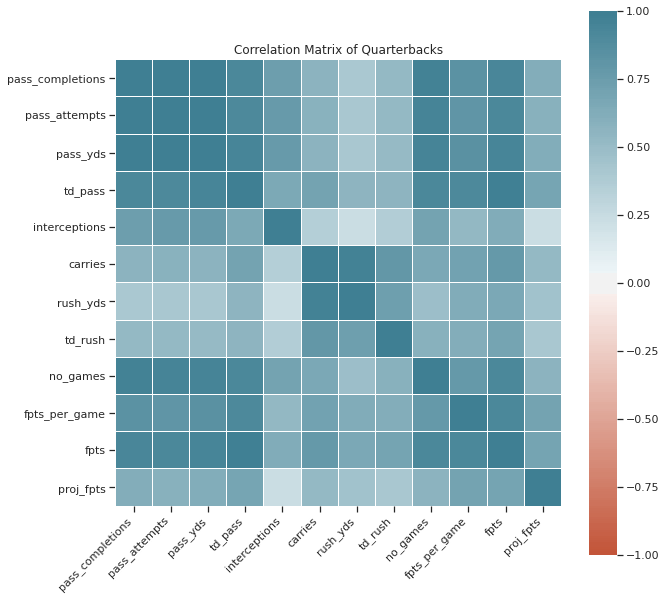

In [ ]:
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    qb_df.corr(), 
    vmin = -1, vmax=1, center=0,
    square=True,
    cmap=sns.diverging_palette(20,220,n=200), 
    linewidth=.005)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.title('Correlation Matrix of Quarterbacks')
plt.show()

As expected, a large majority of the features appear to be correlated with each other! And most are correlated with the 'fpts' target, especially the pass attempts and completions, passing yards, and touchdowns. This means that players with high stats in each category will score more fantasy points. Next, I will use these features to find which players are most like each other in terms of fantasy scoring abilities. 

##K-Means clustering

In [ ]:
# Define the features and the outcome
X = qb_df.drop(columns=['player','proj_fpts'])
y = qb_df.proj_fpts

# Standarizing the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [ ]:
# Here we double check the shape of the features and outcome 
print(X.shape,y.shape)

(52, 11) (52,)


For k-means, determing the optimal *k* is extremely important. To determine a good starting *k*, I have applied the Elbow method. The Elbow method is a popular technique where the idea is to run k-means clustering for a range of clusters *k* and for each value, calculate the sum of squared distances from each point to its assigned center (or distortions).

If we plot the distortions, the resulting graph will look like an arm, where the 'elbow' is the best value of *k*.

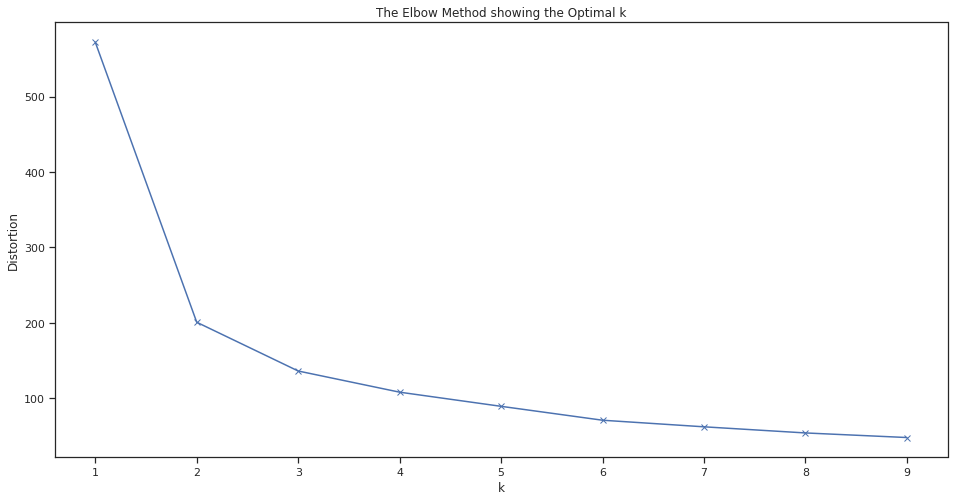

In [ ]:
# Running K-Means with a range of k
distortions = []
K = range(1,10)
for k in K:
  kmeanModel = KMeans(n_clusters=k)
  kmeanModel.fit(X_std)
  distortions.append(kmeanModel.inertia_)

# Plottinhg the distortions of K-Means
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the Optimal k')
plt.show()

From the graph, we can observe that the 'elbow' is at k = 2. Now we can start a K-Means algorithm using n_clusters = 2.

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=2, random_state=123)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

100 loops, best of 3: 15.4 ms per loop


In [ ]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1], dtype=int32)

Now we can visualize the results. To plot in two-dimensional space, we will also need to reduce the data dimensionality. To accomplish this, we can apply PCA and use the first two principal components.

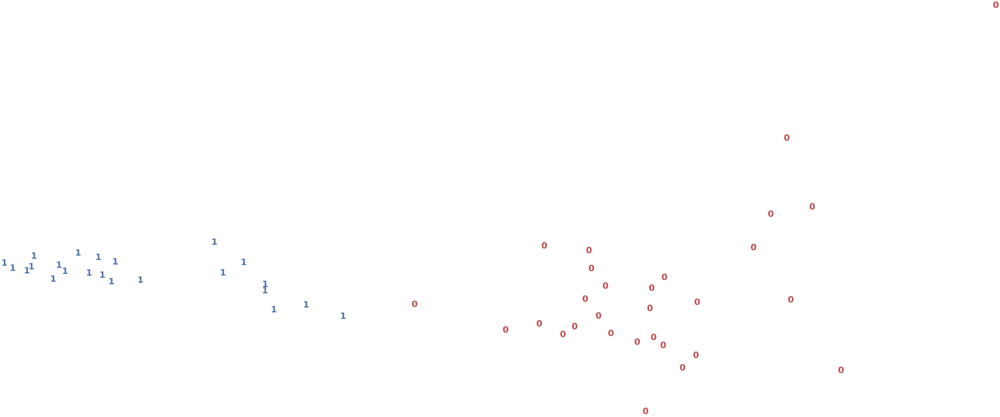

In [ ]:
# Computing the first principal components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Here, we can see that the player ranks are clustered in a coherent manner, but there do appear to be some more clusters we can make. For example, in the blue cluster, there appears to be two clusters we can make, with the red cluster showing the same trend.

Also, if we imagine clusters as "tiers", it stands to reason that having only 2 clusters doesn't really help us in determining which players we should have on our team. 

Next, I will go ahead and try out the KMeans clustering algorithm with different k-values. I think it is valuable to have more than just 2 tiers in fantasy football, as you wouldn't consider a player from the bottom of the first tier to have the same quality as a player from the top of that same tier. I can confirm this from the above visualization. 

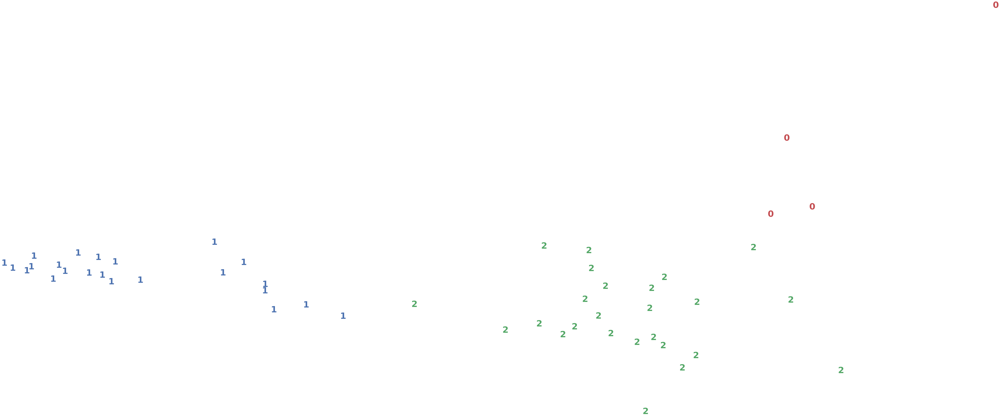

In [ ]:
# Let's try with k-means = 3, 4, 5, 6

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=3, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This looks much better for our tier-making needs. You can see that there is an elite category (the red 0's), but I still believe that the following two tiers are still too broad.

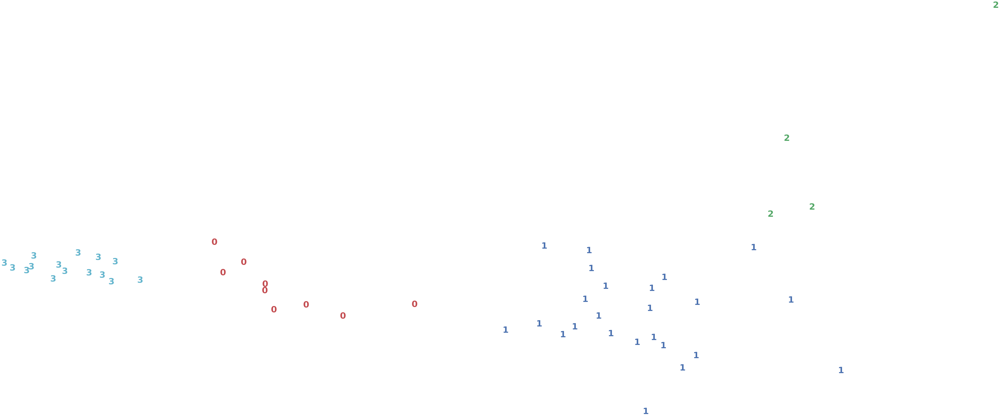

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Ah, now that looks interesting! We still have a "top 4" tier (the green 2's), but the bottom tier has been split in two. Let's see how the next k-means algorithms perform.

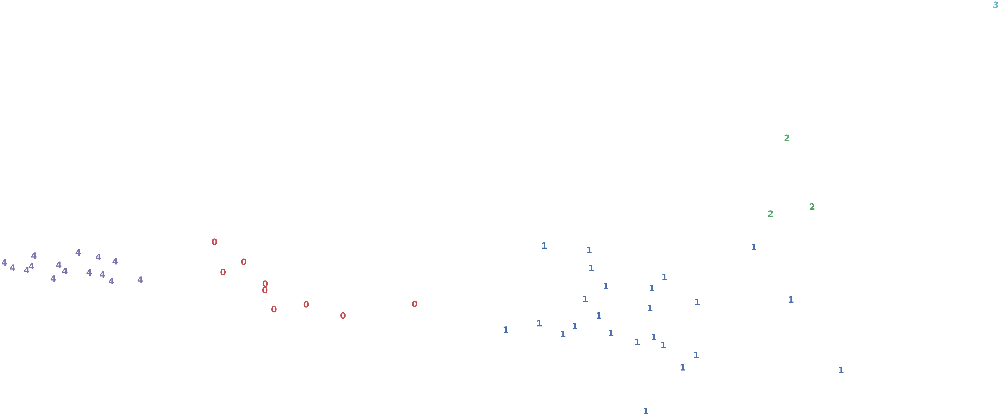

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The only difference here with the last alogorithm where k = 4 is that we now have a cluster with one datapoint. Spoiler alert: this datapoint is Lamar Jackson. Now, normally this cluster would be too narrow, but since this dataset is fairly small (there are only ~50 players being evaluated), having an elite cluster with one outlier might not necessarily be a bad thing. Looking back at the dataset, Lamar Jackson scored almost 100 total points and 7 points per game more than the next quarterback. That's pretty impressive.

I would also point out that the three 1's that appear to be more clustered with the green 2's may indicate that k-means algorithm isn't clustering the data perfectly. After all, those datapoints don't visually appear related to the rest of the blue 1 cluster.

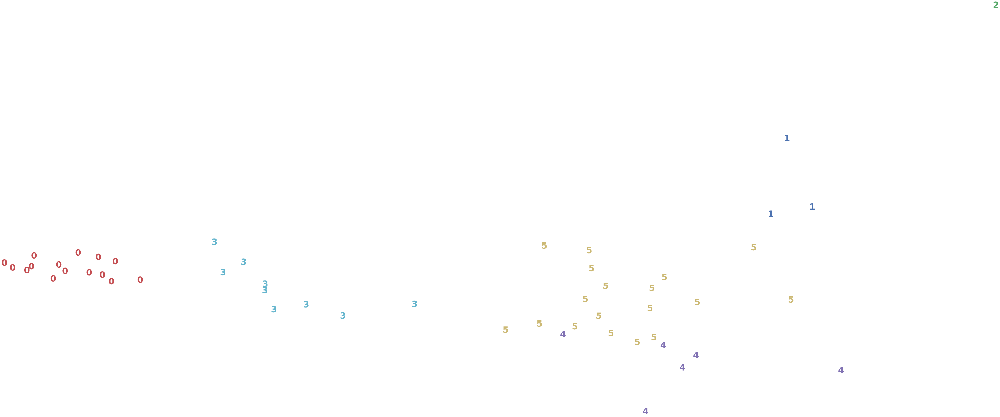

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=6, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Here, the data had a harder time determing which players to fit in which cluster. So, 6 tiers is probably too much.

In conclusion, based on the above visualizations, I'd actually say that the K-MEANS with k = 4 and 5 work out pretty well. As I think 2 clusters doesn't help with our problem--choosing the right player for your team--I'll move ahead with k = 4 and 5.

For k = 3, it works similarly to k = 2, which is to say that a third cluster was created out of the extreme values, but didn't create new clusters from the obvious cluster in cluster 1. 

Now, we can measure *consistency* by comparing two, three, and four cluster solutions for the dataset. This will help determine which k-value optimizes consistency across two sample from the dataset. 

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into four equally-sized samples. First break it in half:

X_half1, X_half2, pca_half1, pca_half2 = train_test_split(
    X_std,
    X_pca,
    test_size=0.5,
    random_state=123)

# Dataframe to store features and predicted cluster memberships:
ypred = pd.DataFrame()

# Pass a list of tuples and a counter that increments each time we go
# through the loop. The tuples are the data to be used by k-means,
# and the PCA-derived features for graphing. We use k-means to fit a
# model to the data, then store the predicted values and the two-feature
# PCA solution in the data frame.
for counter, data in enumerate([
    (X_half1, pca_half1),
    (X_half2, pca_half2)]):
    
    # Put the features into ypred.
    ypred['pca_f1' + '_sample' + str(counter)] = data[1][:, 0]
    ypred['pca_f2' + '_sample' + str(counter)] = data[1][:, 1]
    
    # Generate cluster predictions and store them for clusters 2 to 5.
    for nclust in range(2, 6):
        pred = KMeans(n_clusters=nclust, random_state=123).fit_predict(data[counter])
        ypred['clust' + str(nclust) + '_sample' + str(counter)] = pred

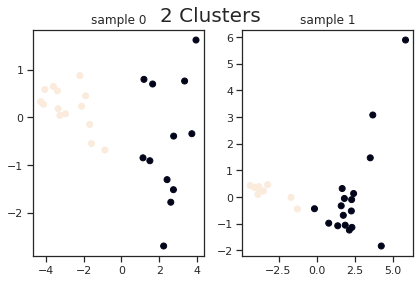

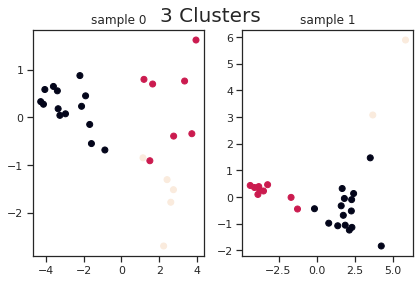

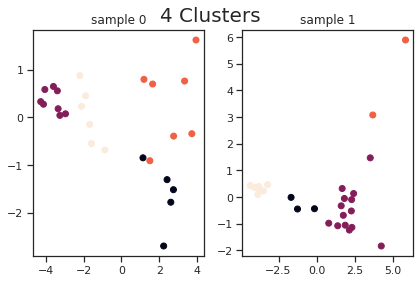

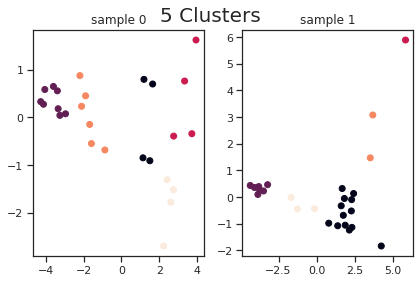

In [ ]:
# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(2, 6):
    
    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('{} Clusters'.format(cluster), fontsize=20)
    plt.tight_layout()
    plt.show()
    print('\n')

Observing the visualizations (and ignoring the coloring), it appears that the five cluster solution isn't consistent across the subsamples, but the four cluster solution actually shows some consistency. However, we can't rely solely on visualizations, as they can be misleading. Next, we'll look at the quantitative ways of evaluating the clustering algorithm.

**Contingency tables:**

In [ ]:
# In order to see all rows, I'll adjust the dataframe options
pd.set_option('display.max_rows', None)
# Get predicted clusters.
full_pred = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

pd.crosstab(qb_df['player'], full_pred) 

col_0,0,1,2,3
player,,,,
AJ McCarron,0,0,0,1
Aaron Rodgers,0,1,0,0
Andy Dalton,0,1,0,0
Baker Mayfield,0,1,0,0
Ben Roethlisberger,0,0,0,1
Brett Hundley,0,0,0,1
Cam Newton,0,0,0,1
Carson Wentz,0,1,0,0
Case Keenum,1,0,0,0


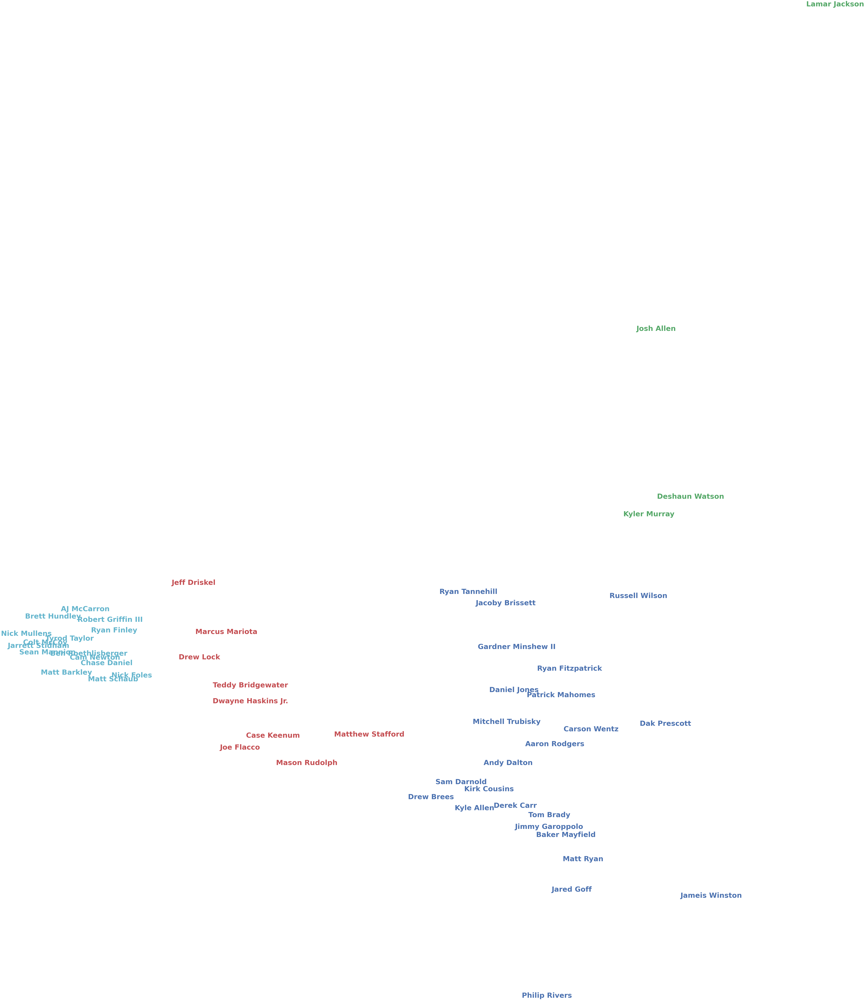

In [ ]:
# Below is a visualtion with the final chosen k-means alogirthm with k = 4
# and the players associated with each cluster

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,15))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(qb_df.player)[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


Here we can actually visualize which players are in which "tier". In the top tier we have Lamar Jackson, Josh Allen, Deshaun Watson, and Kyler Murray. This tracks with their fantasy performance last year, and all four are projected as elite performers in 2020. It's also interesting to note that these quarterbacks are big "runners". That is, a lot of their fantasy points also came from rushing yards and rushing touchdowns. This would indicate that quarterbacks (who are also good passers) with running potential are better fantasy performers than pure pocket passers like Drew Brees or Tom Brady. 

**Silhouette Score**

To evaluate our KMeans algorithm, we can look at the silhouette score. This analysis indicates how far away from a neighboring cluster is from the sample cluster. A value of 0 indicates that the sample is close to the decision boundary between two clusters and 1 indicates that the sample is far away from other clusters. 

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=123)
    preds = clusterer.fit_predict(X_std)
    centers = clusterer.cluster_centers_

    score = metrics.silhouette_score(X_std, preds, metric='euclidean')
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.5718896110821644)
For n_clusters = 3, silhouette score is 0.5422127968273214)
For n_clusters = 4, silhouette score is 0.4442031754779501)
For n_clusters = 5, silhouette score is 0.424833376427175)
For n_clusters = 6, silhouette score is 0.3591115848659082)


Unsurprisingly, the best silhouette score is with two clusters. But as previously discussed, this isn't as useful in the real world. I still believe a four clustered algorithm is a good compromise. It has a worse silhouette score, but a more practical solution.

##Hierarchical clustering

Can we do better than k-means clustering? The only way to find out is to try other clustering methods. First up is Hierarchical clustering, followed by DBSCAN, and concluded with GMM. 

In general, there are two types of hierarchical clustering: Agglomerative and Divisive. For this analysis, I'll be focusing on agglomerative clustering (also known as the bottom-up approach).

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

**Complete**

To start out, I will use four clusters, the *complete* method for linkage, and *cosine* for measuring the similarities of the clusters.

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

Like with KMeans, to visualize the clusters, I will have to perform PCA to the features and use the first two principal components.

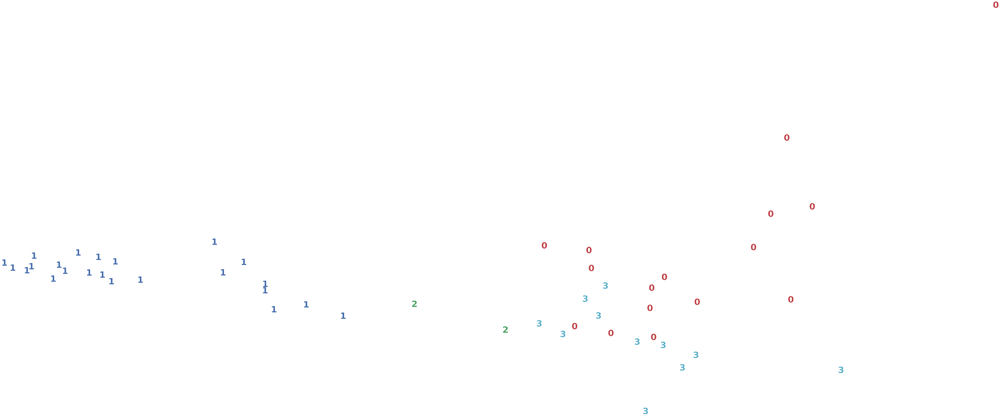

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Based on this visualization, it looks like this clustering algorithm performs worse than k-means. Let's also look at the silhuoette score of the agglomerative clustering solution.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.3141176844031784


As we saw with the visualization, the agglomerative clustering approach performed worse than the k-means.

**Ward**

To exhaust all of our models, let's try the same process with the other two linkage methods: *ward* and *average*.

In [ ]:
# Defining the agglomerative clustering
# I changed the affinity to euclidean here because that is the only affinity that works with linkage = ward
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

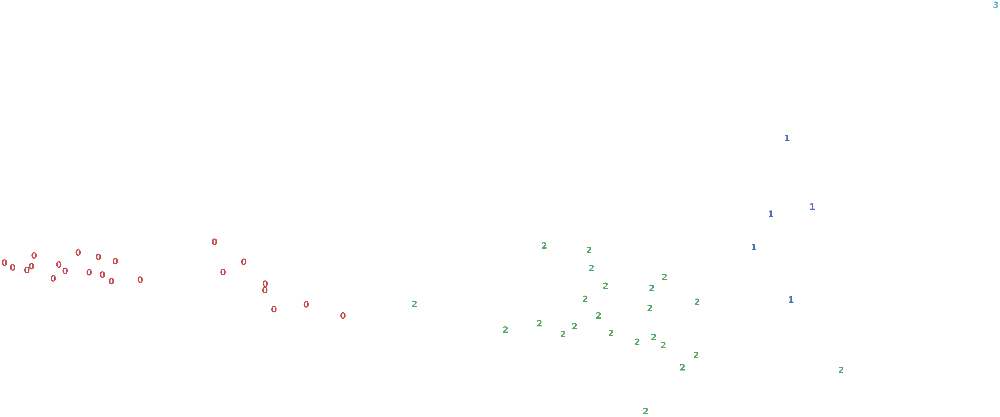

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Visually, it looks much better at clustering than the agglomerate clustering with complete linkage. Let's look at the silhouette score to evaluate its performance.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.4518048257808739


A much better performance! In fact, it performs slightly better than the k-means solution.

**Average**

Finally, we have the solution with *average* linkage.

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

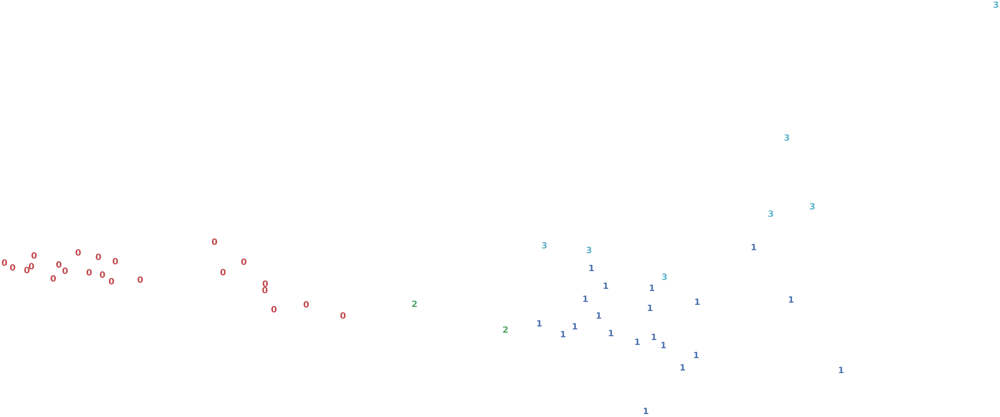

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Visually, this looks the worst of the three different linkage methods. To confirm this, let's take a look at the following silhouette score.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.34652158964920804


As expected, it does perform worse than the other methods. However, it is still slightly better than the solution with complete affinity.

Here, I will produce dendrograms using three different linkage methods: complete, average, and ward. By investigating these dendrograms, we can try and choose the number of clusters that meet our needs.

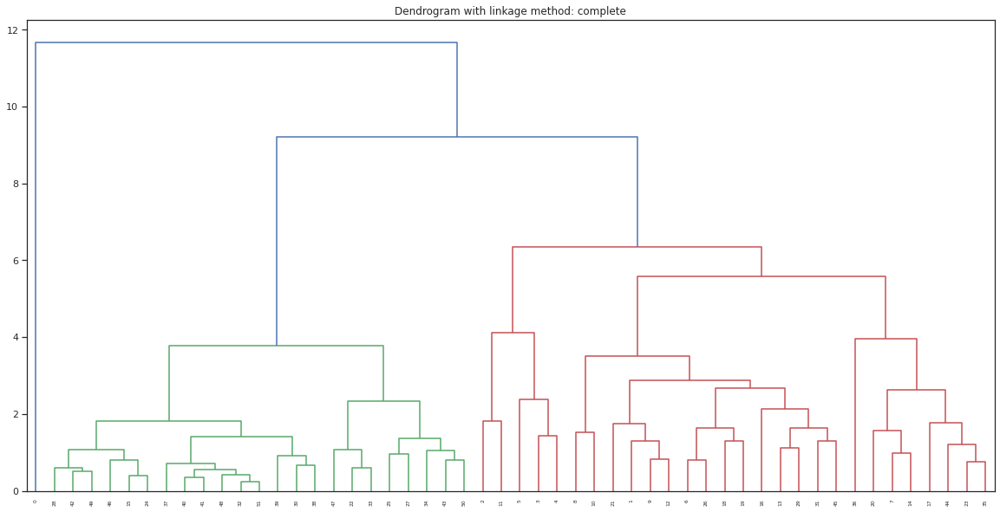

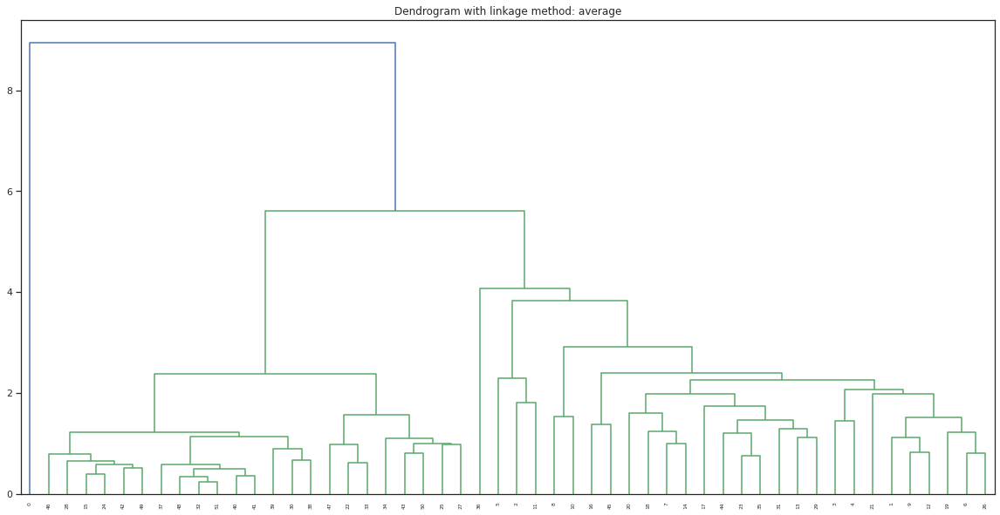

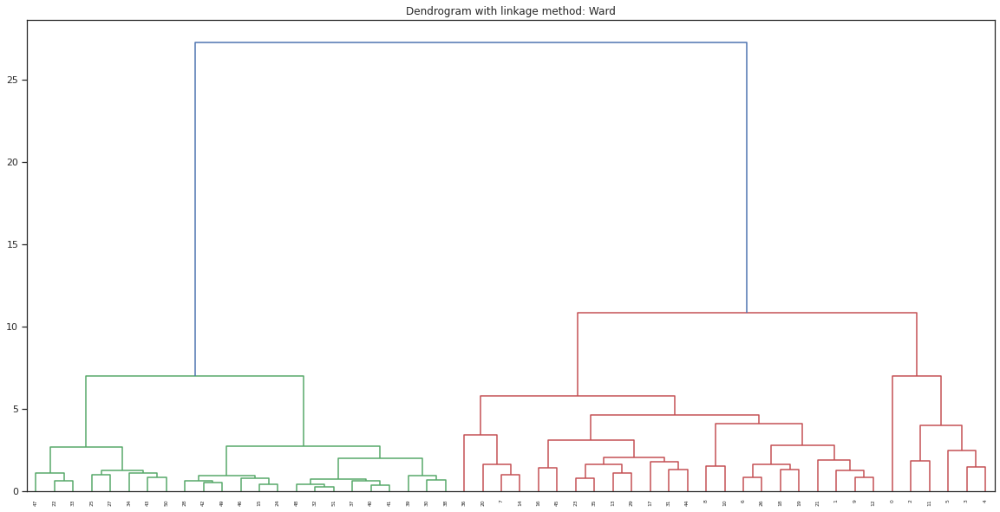

In [ ]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: complete")
dendrogram(linkage(X_std, method='complete'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: average")
dendrogram(linkage(X_std, method='average'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: Ward")
dendrogram(linkage(X_std, method='ward'))
plt.show()

##DBSCAN Approach

For the next method, we will use a method called **density-based spatial clustering of applications with noise**, or **DBSCAN**. 

What sets this method apart from k-means and hierarchical clustering is that this clustering method is good at identifying clusters that aren't well separated. It doesn't require us to specify the number of clusters beforehand, and isn't too sensitive to outliers. It's highly efficient and scales a lot better than the previous two methods.

In [ ]:
from sklearn.cluster import DBSCAN

Although it doesn't require us to define the number of clusters beforehand, there are two hyper-parameters we can tune: epsilon ($\epsilon$) and minPts. To start, we will use an epsilon of one with min_samples = 5. We can adjust these two parameters to find the best combination.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

Now we can visualize the result, just as we have been doing.

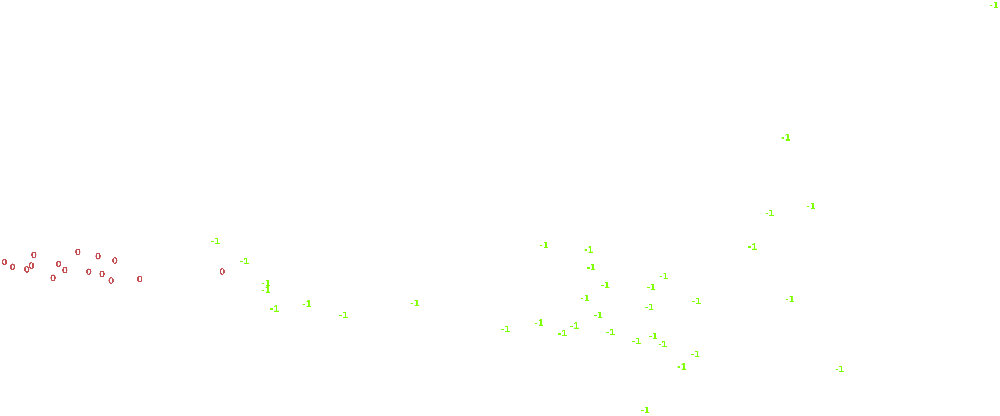

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=1, min_samples=5: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=1, min_samples=5: 0.4608977790655471


So that looks quite terrible. As we can see, there is one red cluster and a lot of lime green -1's. Observations labeled as -1 are noise and don't belong to any cluster. 

This isn't a good showing for DBSCAN. In my next iteration of the method, I'll adjust the two hyper-parameters.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=2, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

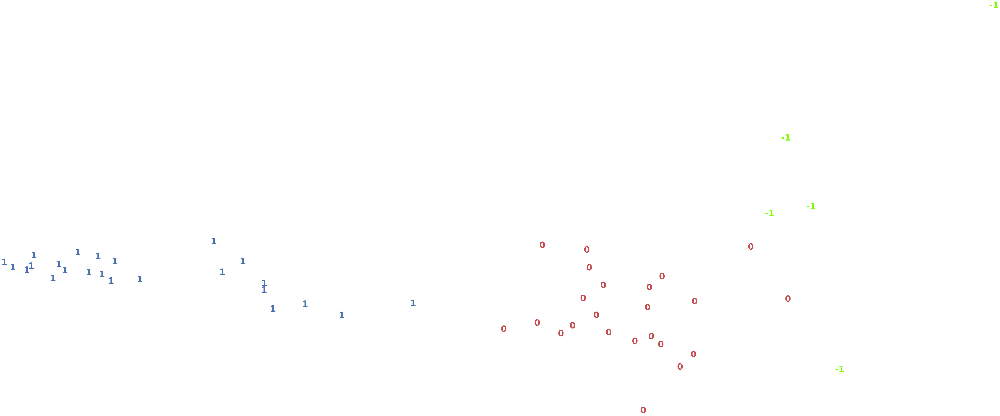

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=2, min_samples=5: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=2, min_samples=5: 0.5169463559542032


This is slightly better, but the top performing quarterbacks are still classified as outliers. Instead of continuing to choose random parameter values, let's think logically. We know that there aren't many observations in this dataset, and that some clusters may have as little as one player (Lamar Jackson). So a min_samples of five would naturally be biased against the "elite" clusters. Let's try again:

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1.6, min_samples=1)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

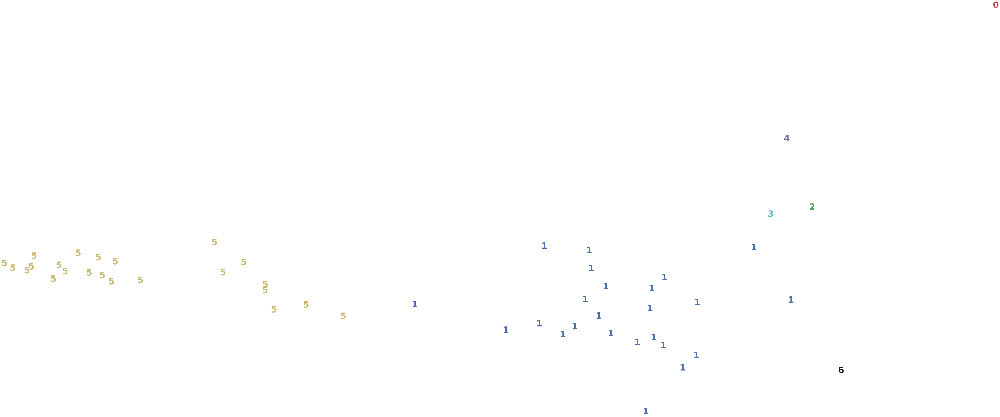

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

A big improvement. However, this doesn't look very ideal. Let's see how each try performed with the silhouette score

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=1.6, min_samples=1: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=1.6, min_samples=1: 0.4016237093549297


Each of these methods had comparable silhouette scores. However, they didn't really pass the eye test. So even if they might have performed well in theory, I'm unconvinced of this method's practical application.

##Gaussian Mixture Models

The last of the clustering methods, **Gaussian Mixture Models (GMM)** is only one that uses *soft clustering*. The previous models all used *hard clustering*. For this model, we can assess the confidence by investigating the probabilities, and it can work with non-linear geometries.

This method aims to find the gaussian distributions for each cluster in the data. 

In [ ]:
from matplotlib.patches import Ellipse
from sklearn.mixture import GaussianMixture

Our first step is to initialize the parameters of each Gaussian. This is followed by estimation and maximization. These last two steps are repeated until we have evaluated the log likelihood of the data. That is, the measure of probability of the data being generated by the Gaussians with the parameters calculated in the previous steps. It stops calculating when the log likelihood or parameter values stop increasing above a threshold.

Since we want to work with four tiers, at least, I'll start with the number of components equal to four. 

In [ ]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=4, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

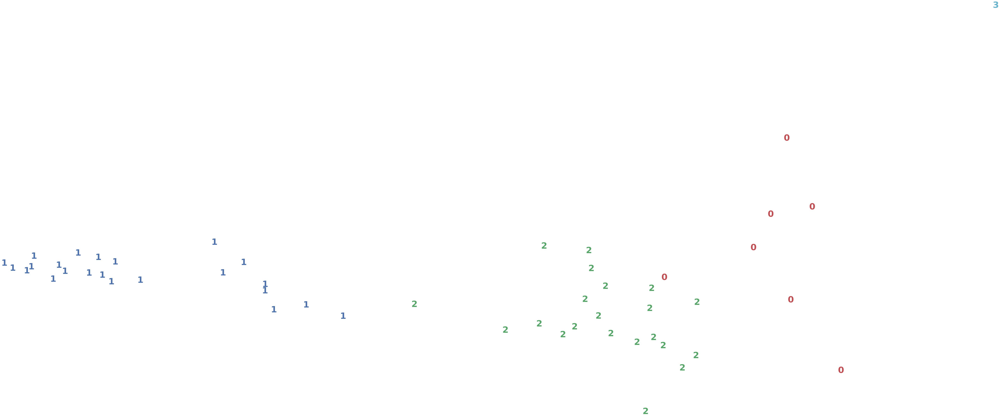

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This is an interesting result. Here, Lamar Jackson is in a tier of his own, which isn't unreasonable, and the second and third tiers are reasonably split. Although the fourth tier looks like it should be split into two more clusters, these are the players that trend toward not being worth having on a fantasy football team. So practically, it may make sense to have this as it's own "do not own" cluster.

In [ ]:
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the GMM solution: 0.4319933771595388


A better score than k-means! I've already talked about how I justified the resulting clusters, and having a slightly better silhouette score for GMM indicates this result may be better than the k-means clustering solution. We should also keep in mind that this algorithm uses k-means in the initialization of the means of the Gaussians, so one could say that this is an improvement on our k-means solution.

In [ ]:
# re-labeling
pd.crosstab(qb_df['player'],clusters)

col_0,0,1,2,3
player,,,,
AJ McCarron,0,1,0,0
Aaron Rodgers,0,0,1,0
Andy Dalton,0,0,1,0
Baker Mayfield,0,0,1,0
Ben Roethlisberger,0,1,0,0
Brett Hundley,0,1,0,0
Cam Newton,0,1,0,0
Carson Wentz,0,0,1,0
Case Keenum,0,1,0,0


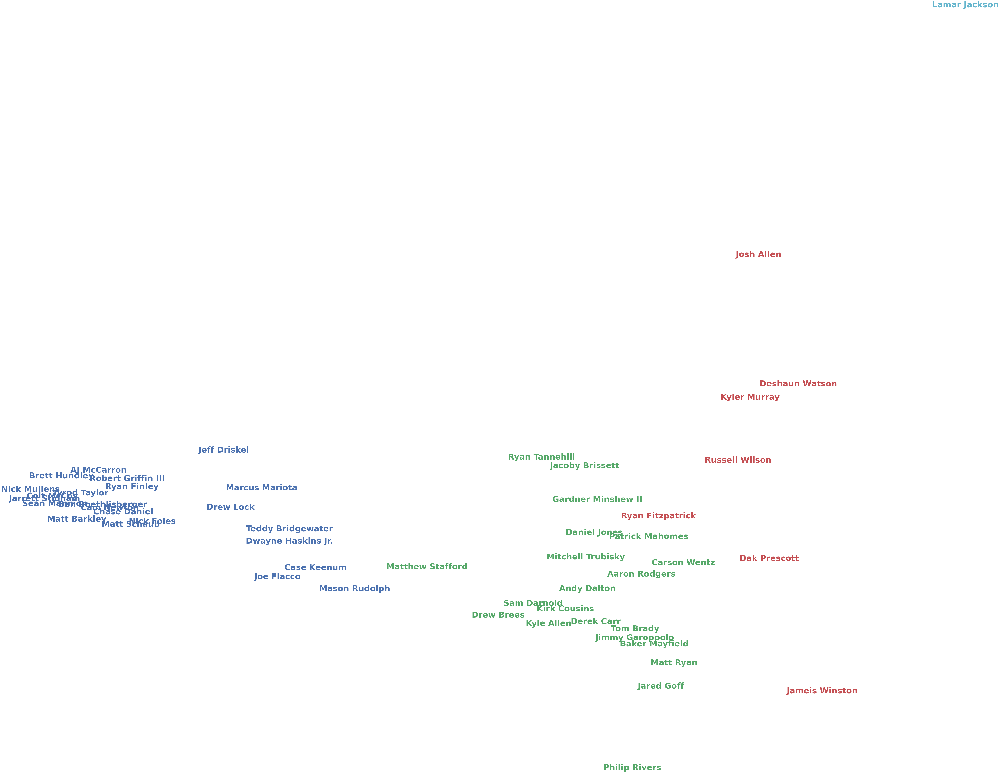

In [ ]:
# Below is a visualtion with the players associated with each cluster

plt.figure(figsize=(10,10))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(qb_df.player)[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


Now let's demonstrate the *soft clustering* abilities of the GMM. This resizes the points according to the highest probability assigned to them by the winning cluster.

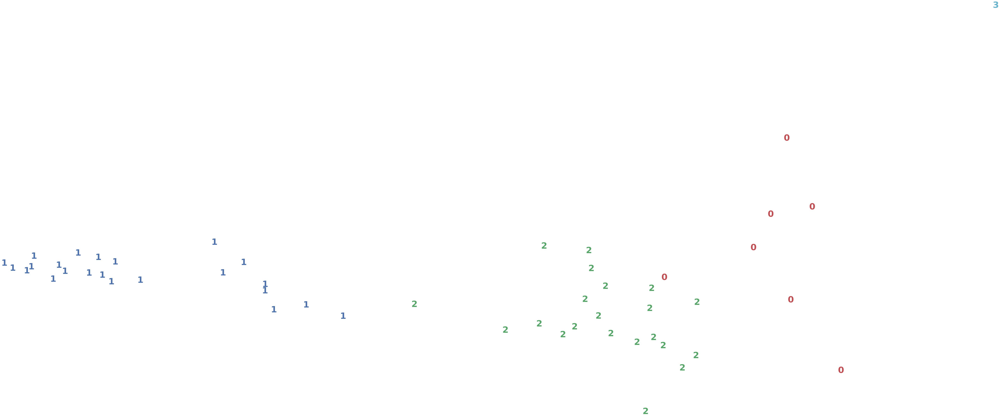

In [ ]:
probs = gmm_cluster.predict_proba(X_std)

size = 50 * probs.max(1) ** 2  # square emphasizes differences

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': size[i]}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#Runningbacks

Now, we move on to runningbacks. Although we started with quarterbacks, runningback is arguably the most valuable position on a fantasy football team. This is because there are few elite runningbacks and the NFL is geared toward the passing game. Thus, there will be a surplus of wide receivers, and multiple opportunities for a quarterback to score points based on the volume of passes they tend to throw. With runningbacks, you either need a RB that is heavily involved in the passing game, is heavily utilized in the red zone, or is so good that the offense is built around him.

##Importing the Data

Reading and transforming dataset in a pandas DataFrame from a csv file, along with basic information of the dataset. My second analysis will focus on Runningbacks. 

In [ ]:
rb_df = pd.read_csv('https://raw.githubusercontent.com/NehemiahSolis/NFL-Fantasy-Football-Rankings/master/rb_stats_and_projections.csv')
rb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       254 non-null    int64  
 1   PLAYER NAME      254 non-null    object 
 2   TEAM NAME        254 non-null    object 
 3   PLAYER POSITION  254 non-null    object 
 4   2019 CAR         164 non-null    float64
 5   2019 RUSH YDS    164 non-null    float64
 6   2019 RUSH AVG    164 non-null    float64
 7   2019 RUSH TD     164 non-null    float64
 8   2019 REC         164 non-null    float64
 9   2019 REC YDS     164 non-null    float64
 10  2019 REC TDS     164 non-null    float64
 11  GAMES            168 non-null    float64
 12  FPTS/GAME        170 non-null    object 
 13  2019 FPTS        169 non-null    float64
 14  2020 CAR         150 non-null    float64
 15  2020 RUSH YARDS  150 non-null    float64
 16  2020 RUSH AVG    150 non-null    float64
 17  2020 RUSH TD    

As this dataset is from the same source (FantasyPros), I will perform the same exploratory data analysis and data prep as beforehand with the quarterbacks.

In [ ]:
rb_df.columns

Index(['Unnamed: 0', 'PLAYER NAME', 'TEAM NAME', 'PLAYER POSITION', '2019 CAR',
       '2019 RUSH YDS', '2019 RUSH AVG', '2019 RUSH TD', '2019 REC',
       '2019 REC YDS', '2019 REC TDS', 'GAMES', 'FPTS/GAME', '2019 FPTS',
       '2020 CAR', '2020 RUSH YARDS', '2020 RUSH AVG', '2020 RUSH TD',
       '2020 REC', '2020 REC YDS', '2020 REC TD', '2020 FPTS',
       'Player OUTLOOK'],
      dtype='object')

In [ ]:
rb_df.head()

,Unnamed: 0,PLAYER NAME,TEAM NAME,PLAYER POSITION,2019 CAR,2019 RUSH YDS,2019 RUSH AVG,2019 RUSH TD,2019 REC,2019 REC YDS,2019 REC TDS,GAMES,FPTS/GAME,2019 FPTS,2020 CAR,2020 RUSH YARDS,2020 RUSH AVG,2020 RUSH TD,2020 REC,2020 REC YDS,2020 REC TD,2020 FPTS,Player OUTLOOK
0,1,Christian McCaffrey,Panthers,RB,287.0,1387.0,4.8,15.0,116.0,1005.0,4.0,16.0,29.45,471.20,233.0,1048.0,4.5,9.0,90.0,736.0,3.0,333.95,McCaffrey returns as the feature back in Carol...
1,2,Ezekiel Elliott,Cowboys,RB,301.0,1357.0,4.5,12.0,54.0,420.0,2.0,16.0,19.48125,311.70,282.0,1244.0,4.4,10.0,57.0,455.0,2.0,300.76,Elliott returns as the clear feature back in D...
2,3,Saquon Barkley,Giants,RB,217.0,1003.0,4.6,6.0,52.0,438.0,2.0,13.0,18.77692308,244.10,261.0,1176.0,4.5,10.0,57.0,458.0,3.0,292.33,Barkley's 2019 season fell short of lofty expe...
3,4,Dalvin Cook,Vikings,RB,250.0,1135.0,4.5,13.0,53.0,519.0,0.0,14.0,20.88571429,292.40,245.0,1051.0,4.3,10.0,64.0,536.0,1.0,291.72,Cook's career has thus far been marred by inju...
4,5,Alvin Kamara,Saints,RB,171.0,797.0,4.7,5.0,81.0,533.0,1.0,14.0,17.75142857,248.52,194.0,876.0,4.5,8.0,78.0,600.0,3.0,290.39,Kamara is coming off an up-and-down 2019 campa...


Drop predictive and irrelevant columns:

In [ ]:
rb_df.drop(columns=['2020 CAR', '2020 RUSH YARDS', '2020 RUSH AVG', '2020 RUSH TD',
                    '2020 REC', '2020 REC YDS', '2020 REC TD','Player OUTLOOK',
                    'TEAM NAME','PLAYER POSITION','Unnamed: 0'],inplace=True)

Rename remaining columns for ease of future use:

In [ ]:
rb_df.rename(columns={'PLAYER NAME':'player','2019 CAR':'carries','2019 RUSH YDS':'rush_yds',
                      '2019 RUSH AVG':'rush_avg','2019 RUSH TD':'td_rush','2019 REC':'receptions',
                      '2019 REC YDS':'rec_yds','2019 REC TDS':'td_rec','GAMES':'no_games',
                      'FPTS/GAME':'fpts_per_game','2019 FPTS':'fpts','2020 FPTS':'proj_fpts'},inplace=True)

##Exploratory Data Analysis

In [ ]:
rb_df.head()

,player,carries,rush_yds,rush_avg,td_rush,receptions,rec_yds,td_rec,no_games,fpts_per_game,fpts,proj_fpts
0,Christian McCaffrey,287.0,1387.0,4.8,15.0,116.0,1005.0,4.0,16.0,29.45,471.20,333.95
1,Ezekiel Elliott,301.0,1357.0,4.5,12.0,54.0,420.0,2.0,16.0,19.48125,311.70,300.76
2,Saquon Barkley,217.0,1003.0,4.6,6.0,52.0,438.0,2.0,13.0,18.77692308,244.10,292.33
3,Dalvin Cook,250.0,1135.0,4.5,13.0,53.0,519.0,0.0,14.0,20.88571429,292.40,291.72
4,Alvin Kamara,171.0,797.0,4.7,5.0,81.0,533.0,1.0,14.0,17.75142857,248.52,290.39


Sweet, everything looks to be in order. Next, I always want to check for any missing values

In [ ]:
rb_df.isnull().sum()

player             0
carries           90
rush_yds          90
rush_avg          90
td_rush           90
receptions        90
rec_yds           90
td_rec            90
no_games          86
fpts_per_game     84
fpts              85
proj_fpts        103
dtype: int64

Just like before, I'll drop the missing values for the same reasons.

In [ ]:
rb_df.dropna(inplace=True)
rb_df.isnull().sum()

player           0
carries          0
rush_yds         0
rush_avg         0
td_rush          0
receptions       0
rec_yds          0
td_rec           0
no_games         0
fpts_per_game    0
fpts             0
proj_fpts        0
dtype: int64

Now let's glance at the distributive properties of the data

In [ ]:
rb_df.describe()

,carries,rush_yds,rush_avg,td_rush,receptions,rec_yds,td_rec,no_games,fpts,proj_fpts
count,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000
mean,87.478992,376.260504,3.697479,2.857143,20.747899,166.890756,0.815126,12.588235,95.478319,90.186387
std,89.396835,403.752262,1.691227,3.596811,22.139855,185.283968,1.340164,4.217421,92.635776,88.476395
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-4.000000,0.120000
25%,11.000000,33.000000,3.000000,0.000000,3.500000,23.000000,0.000000,11.000000,14.650000,14.770000
50%,58.000000,213.000000,3.900000,2.000000,13.000000,102.000000,0.000000,14.000000,68.200000,55.100000
75%,137.000000,605.500000,4.600000,4.500000,34.000000,252.000000,1.000000,16.000000,150.250000,155.730000
max,303.000000,1540.000000,10.000000,16.000000,116.000000,1005.000000,8.000000,16.000000,471.200000,333.950000


As before, we'll be standardizing all the features in order to run the following clustering algorithms. I'll be going through the exact same process as before with quarterbacks, with slight adjustments made as necessary.

Now let's take a quick glance at the scatter plot of the features and target (fantasy points), just to get a sense of the feature's correlations with each other.

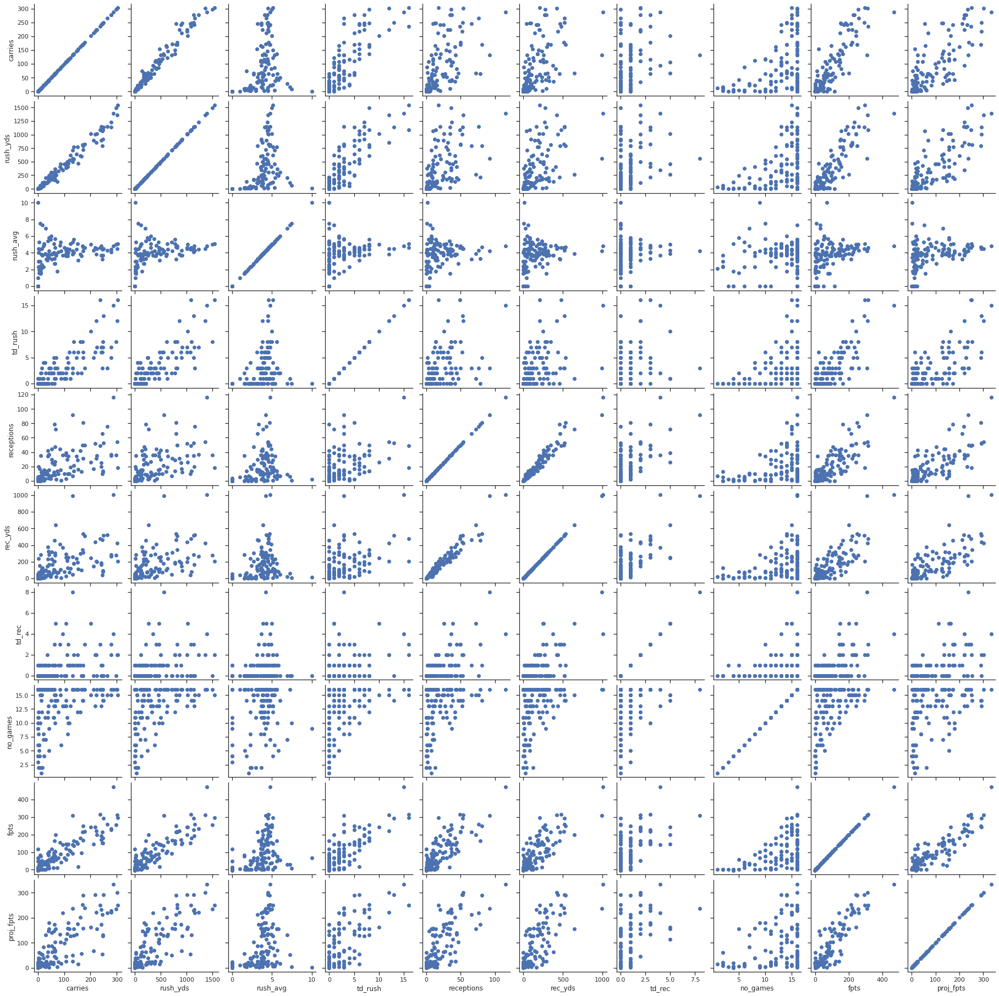

In [ ]:
sns.set(style="ticks")
g = sns.PairGrid(rb_df.drop(columns='fpts_per_game'))
g.map(plt.scatter);

Like the quarterbacks, all of the features in the runningback dataset appear to be positively correlated to the 'fpts' target, so it would be fine to keep every feature for our anaylsis. I'll also look at a correlation heat map, as it's a good visualization tool for judging the strength of correlations between features and the target.

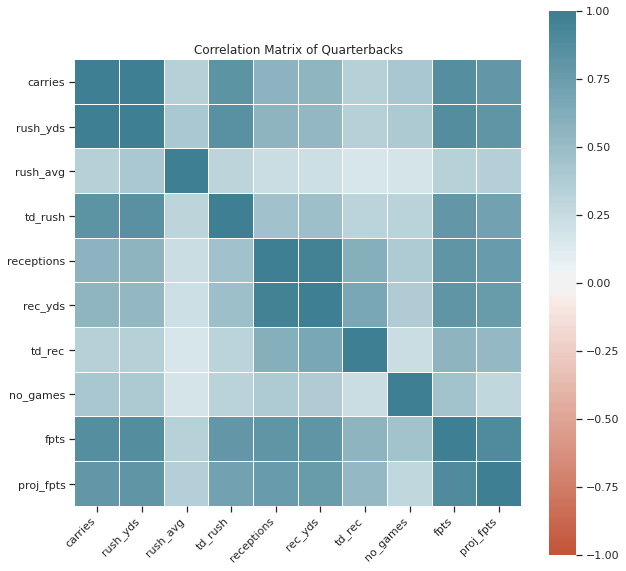

In [ ]:
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    rb_df.corr(), 
    vmin = -1, vmax=1, center=0,
    square=True,
    cmap=sns.diverging_palette(20,220,n=200), 
    linewidth=.005)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.title('Correlation Matrix of Quarterbacks')
plt.show()

Here, it appears that there is a strong correlation between rush yards, rush touchdowns, receptions, and reception yards. This confirms my earlier hypothesis that the best runningbacks are those who are heavily involved in the passing game.

##K-Means Clustering

In [ ]:
# Define the features and the outcome
X = rb_df.drop(columns=['player','proj_fpts'])
y = rb_df.proj_fpts

# Standarizing the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [ ]:
# Here we double check the shape of the features and outcome 
print(X.shape,y.shape)

(119, 10) (119,)


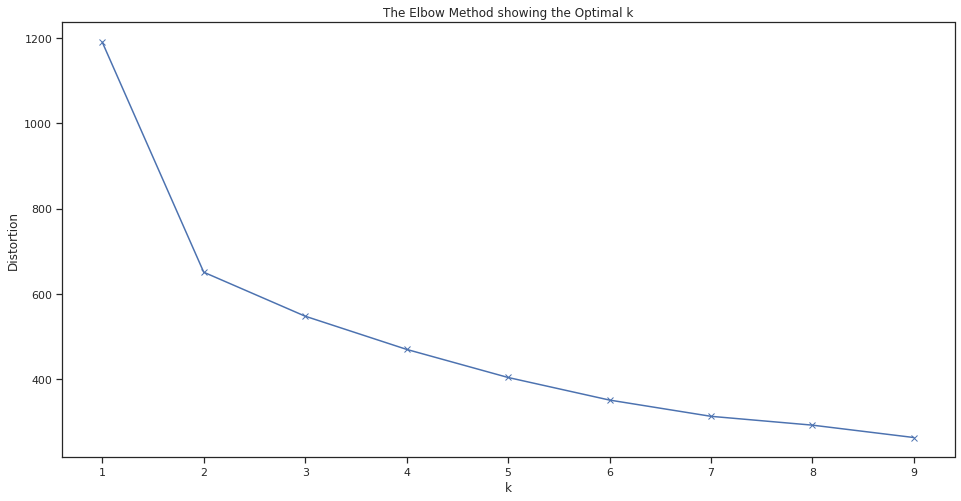

In [ ]:
# Running K-Means with a range of k
distortions = []
K = range(1,10)
for k in K:
  kmeanModel = KMeans(n_clusters=k)
  kmeanModel.fit(X_std)
  distortions.append(kmeanModel.inertia_)

# Plottinhg the distortions of K-Means
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the Optimal k')
plt.show()

Like before, the optimal k = 2.

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=2, random_state=123)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

10 loops, best of 3: 22.1 ms per loop


In [ ]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

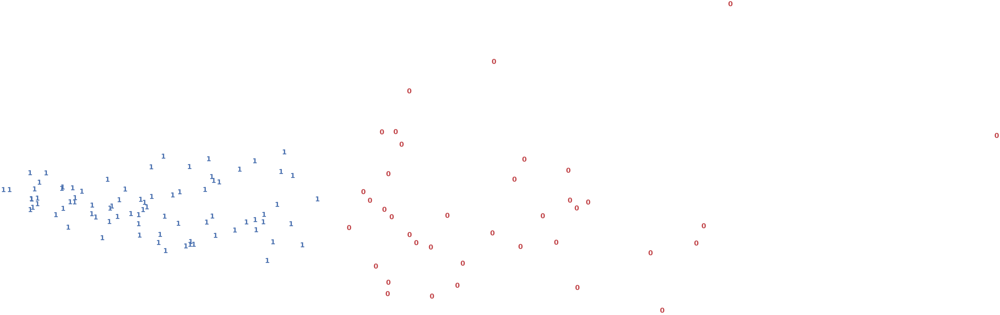

In [ ]:
# Computing the first principal components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Right off the bat, we can see that there are a lot more runningbacks than quarterbacks. Twice the amount, in fact. We can also see, like with the QBs, that there some more clusters that we may be able to work with.

Next, I will again go ahead and try out the KMeans clustering algorithm with different k-values.  

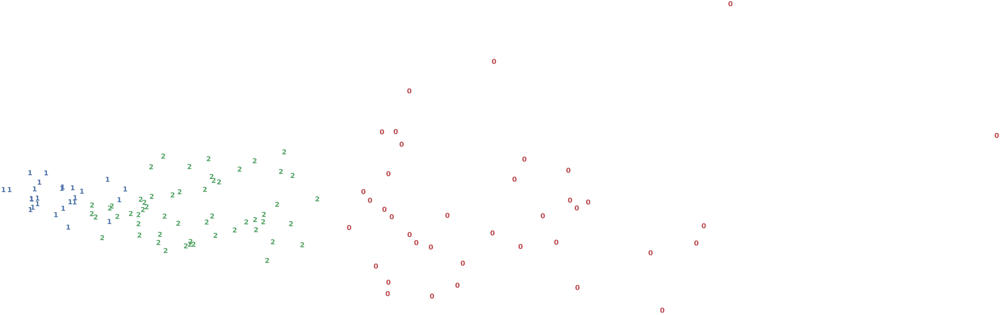

In [ ]:
# Let's try with k-means = 3, 4, 5, 6

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=3, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Here we see some mingling in the blue and green clusters. Based on this visualization, the RBs might end up being harder to cluster in clean tiers than the QBs.

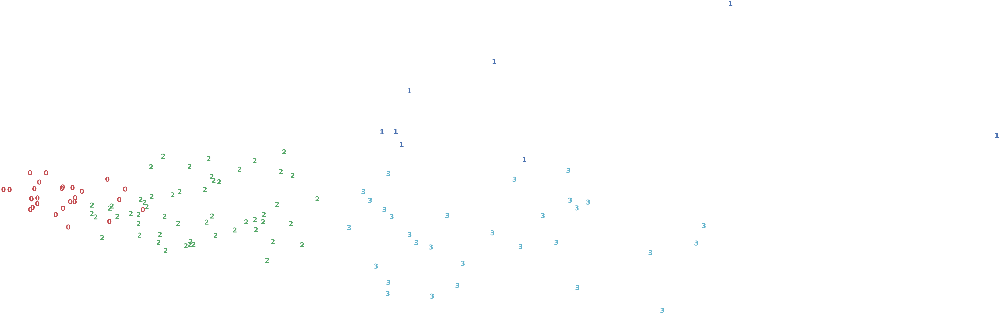

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

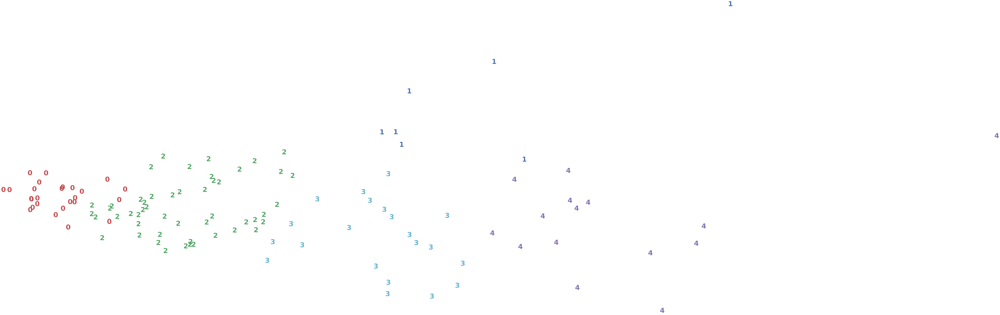

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

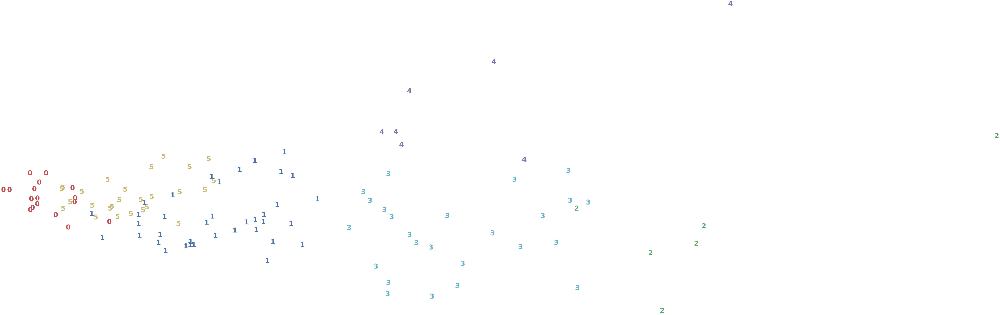

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=6, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Even though I want more tiers, it might be hard to justify using four, five, or six clusters, as you can see that they are starting to really interfere in other clusters.

In conclusion, I will tentatively work with k = 5, as I am willing to work with a less than ideal result in order to have more tiers. Afterall, a player like Christian McCaffery shouldn't be in the same tier as Tevin Coleman. And aside from the mingling of clusters in the "lower" tiers, the better players appear to be clustered well enough. This is fine because I'm not as interested in the clusters of poorly performing players as I am with the top tier players.

**Contingency Table**

In [ ]:
# In order to see all rows, I'll adjust the dataframe options
pd.set_option('display.max_rows', None)
# Get predicted clusters.
full_pred = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

pd.crosstab(rb_df['player'], full_pred) 

col_0,0,1,2,3
player,,,,
Aaron Jones,0,0,0,1
Adrian Peterson,0,0,0,1
Alec Ingold,1,0,0,0
Alex Armah,0,0,1,0
Alexander Mattison,0,0,1,0
Alvin Kamara,0,0,0,1
Ameer Abdullah,0,0,1,0
Anthony Sherman,1,0,0,0
Austin Ekeler,0,1,0,0


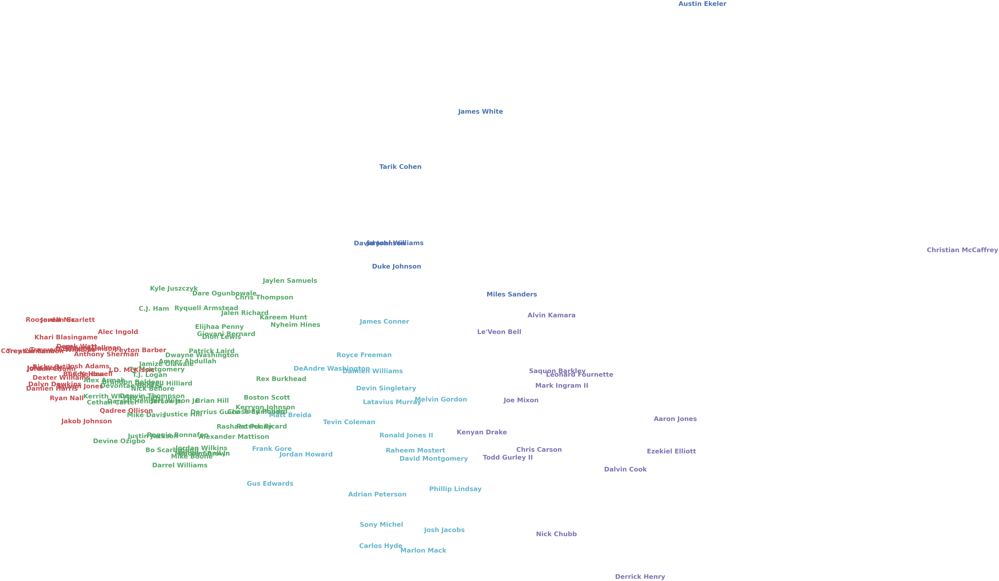

In [ ]:
# Below is a visualtion with the final chosen k-means alogirthm with k = 5
# and the players associated with each cluster

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,10))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(rb_df.player)[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

With my prior knowledge of football and player performance, I am willing to sacrifice cluster performance in the bottom tiers to separate the top tiers as seen above. This looks relatively good for choosing a fantasy football player.

With that said, let's look at the silhouette score and determine if it's *too* much optimizational sacrifice.

**Silhouette Score**

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=123)
    preds = clusterer.fit_predict(X_std)
    centers = clusterer.cluster_centers_

    score = metrics.silhouette_score(X_std, preds, metric='euclidean')
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.41844817381146343)
For n_clusters = 3, silhouette score is 0.26051950734274576)
For n_clusters = 4, silhouette score is 0.266518978933154)
For n_clusters = 5, silhouette score is 0.23803038477568145)
For n_clusters = 6, silhouette score is 0.23647280736133452)


Fortuantely, it appears that we don't have any significant drop off in performance between three and six clusters. While there is a significant drop between two and three clusters, we have already discussed how two clusters wouldn't be helpful to our problem.

##Hierarchical clustering

Now, let's go through the next few steps as we did before for the next three methods. First up, again, is hierarchical clustering. As before, we'll tune the hyper-parameters to optimize our results.

**Complete**

To start out, I will use five clusters, the *complete* method for linkage, and *cosine* for measuring the similarities of the clusters.

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=5)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

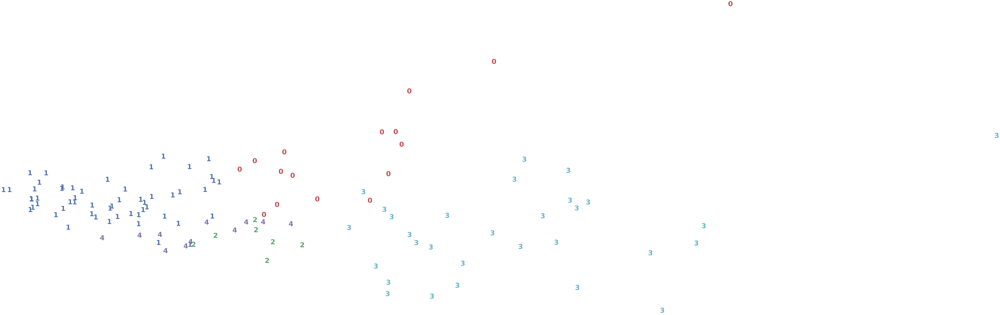

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Unlike with k-means, that looks pretty bad. Before tuning the parameters, I'll try again with four clusters instead of five

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

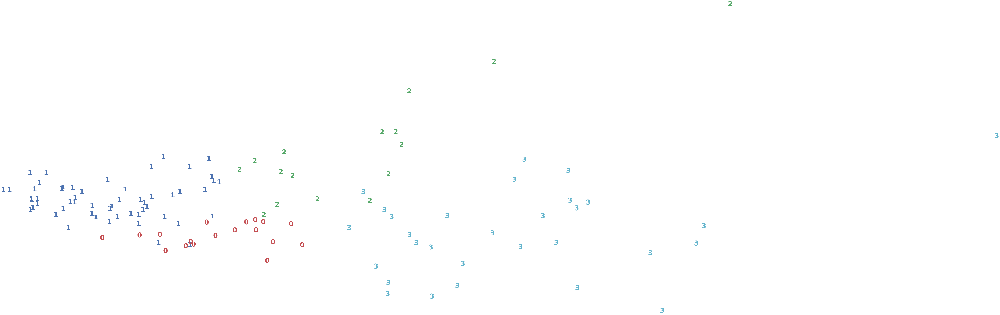

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.1948385499533312


That looks better. However, the silhouette score is even worse than it was previously! 

Let's move on to other agglomerate cluster solutions.

**Ward**

In [ ]:
# Defining the agglomerative clustering
# I changed the affinity to euclidean here because that is the only affinity that works with linkage = ward
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=5)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

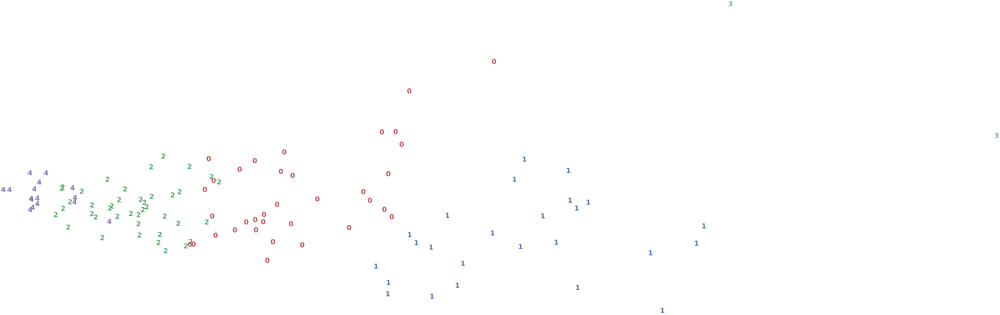

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Visually, it looks much better than the solution with *complete* linkage. This one even used five clusters!

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.2257447629496552


The score here performed about on par with the k-means solutions.

**Average**

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

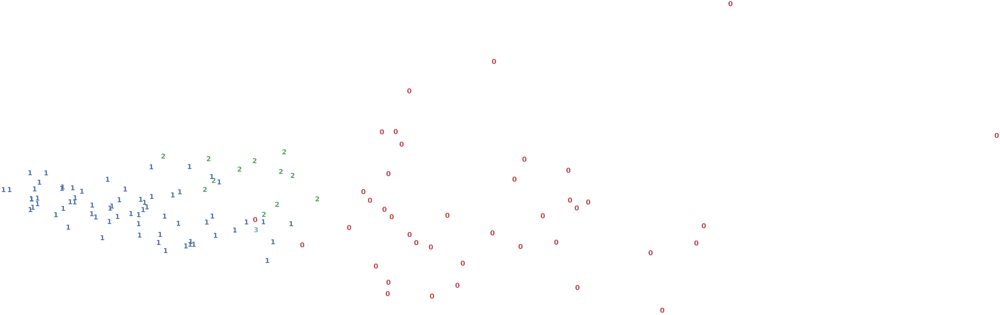

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.08544839293941846


It goes without saying, this is our worst performing clustering solution yet!

**Dendrograms**

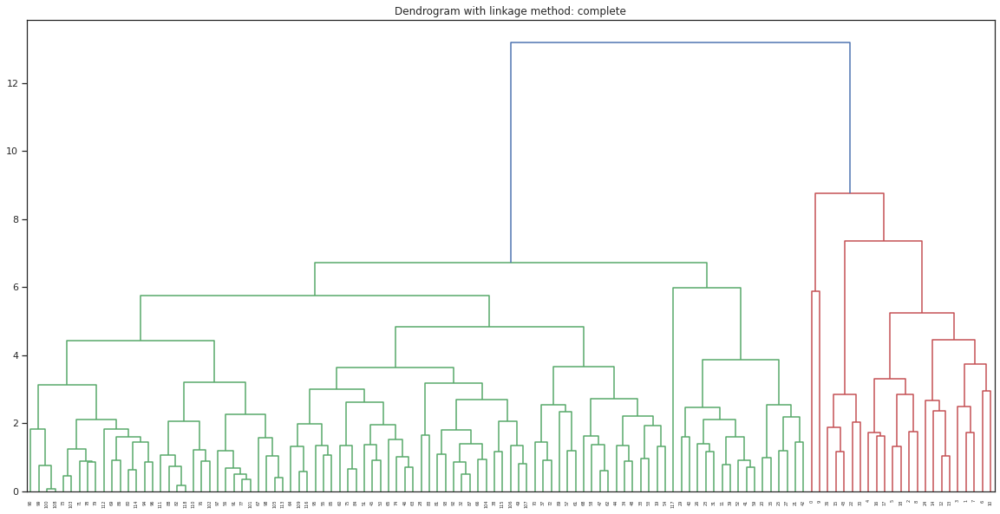

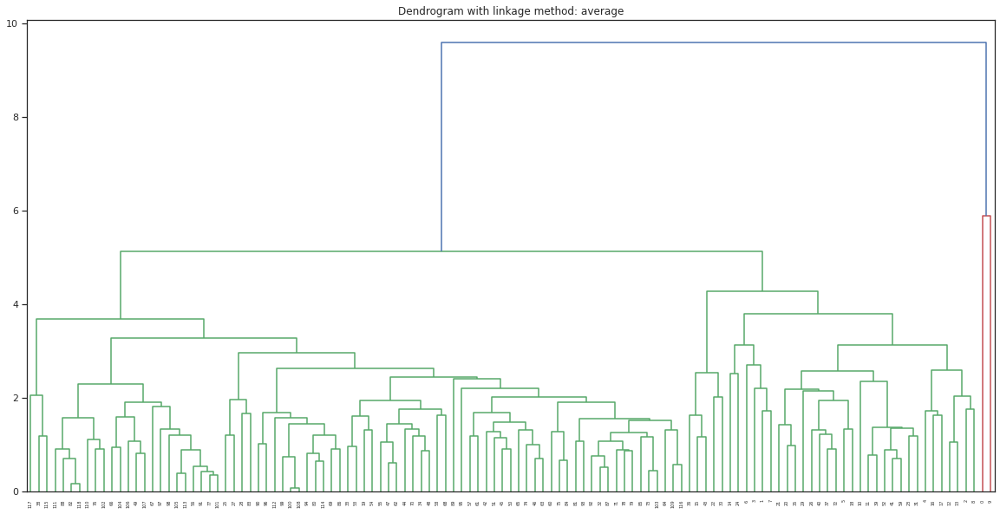

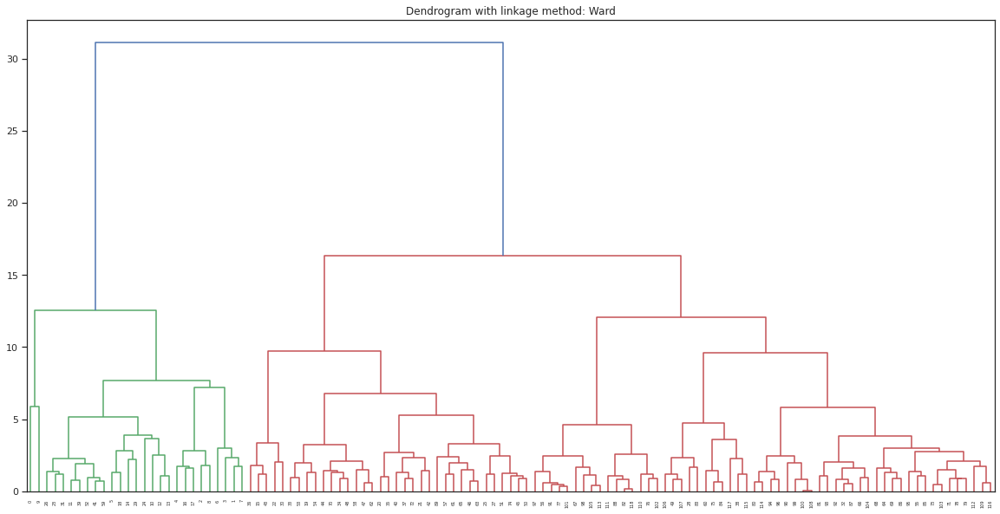

In [ ]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: complete")
dendrogram(linkage(X_std, method='complete'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: average")
dendrogram(linkage(X_std, method='average'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: Ward")
dendrogram(linkage(X_std, method='ward'))
plt.show()

##DBSCAN Approach

The same rules as previously described apply here. Let's see how the runningbacks perform!

As we saw before, there are two hyper-parameters we can tune: epsilon ($\epsilon$) and minPts. To start, we will use an epsilon of one with min_samples = 5. We can adjust these two parameters to find the best combination.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

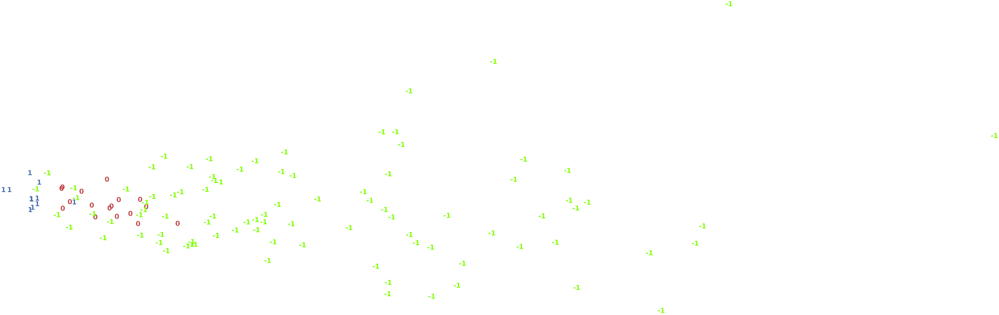

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=1, min_samples=5: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=1, min_samples=5: 0.06263116228674859


It looks like we have a new underperformer. As before, this method seems to be highly sensitive to outliers, so I'll just adjust the epsilon and minPts until an acceptable clustering solution is found.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=2, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

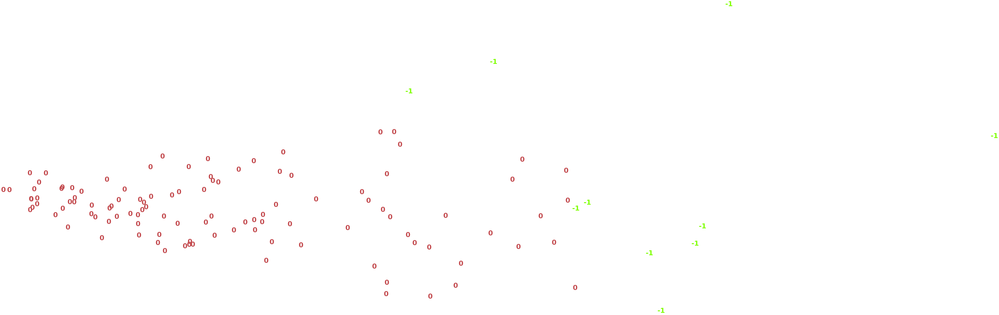

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=2, min_samples=5: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=2, min_samples=5: 0.43570354129647093


Although not everything is an outlier anymore, everything that isn't an outlier is in one cluster. Again, my minPts is too large.



In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=2, min_samples=1)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

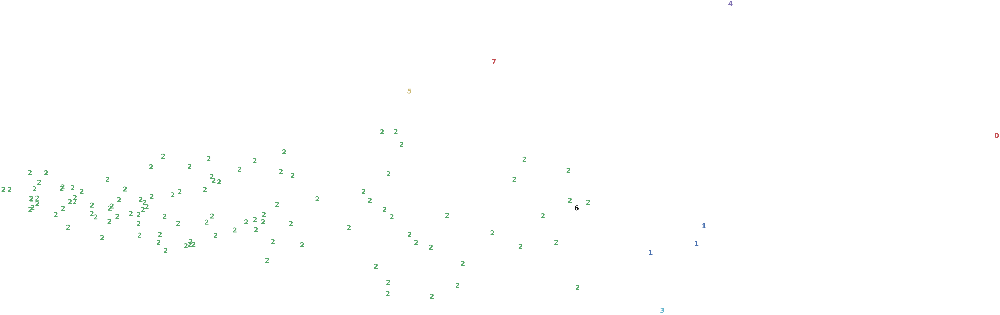

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=2, min_samples=1: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=2, min_samples=1: 0.18284660967756133


Unfortunately, I don't think I am going to get a good result from the DBSCAN approach. The above is one of the better cluster solutions I was able to obtain without getting an excessive amount of observations labeled as outliers, or that broke the algorithm.

##Gaussian Mixture Models (the GMM)

This model did well with quarterbacks. Let's see if it can do well again with such an important position.

Since I want to work with five tiers, at first, I'll start with the number of components equal to five. 

In [ ]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=5, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

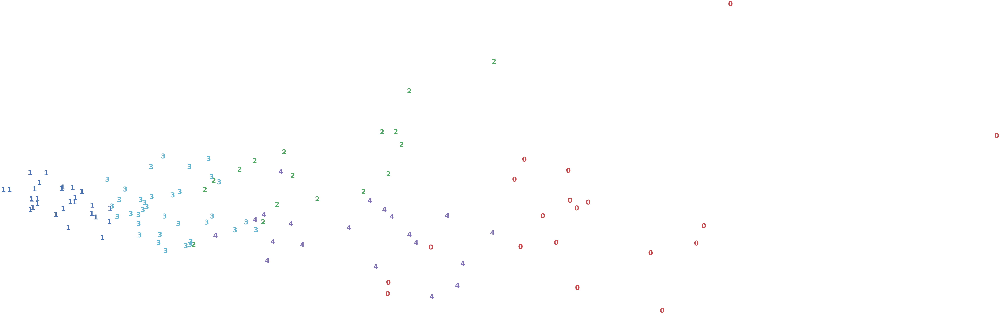

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the GMM solution: 0.13629950701681465


At first glance, this a breath of fresh air after the, quite frankly, underwhelming results of DBSCAN. While many observations look like they might be misclassed, the overall cluster solution appears acceptably useful. I'll try again with four components.

In [ ]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=4, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

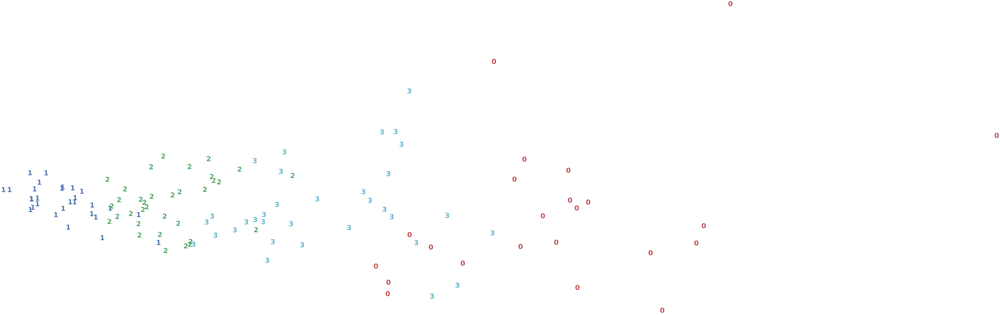

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the GMM solution: 0.1457439224279265


This is arguably even better, although I did like how having five components split up the higher-performing player clusters. Both have lower silhouette scores than k-means. However, this doesn't necessarily mean they are worse than the k-means solution.

In [ ]:
# re-labeling
pd.crosstab(rb_df['player'],clusters)

col_0,0,1,2,3
player,,,,
Aaron Jones,1,0,0,0
Adrian Peterson,1,0,0,0
Alec Ingold,0,0,1,0
Alex Armah,0,1,0,0
Alexander Mattison,0,0,0,1
Alvin Kamara,1,0,0,0
Ameer Abdullah,0,0,1,0
Anthony Sherman,0,1,0,0
Austin Ekeler,1,0,0,0


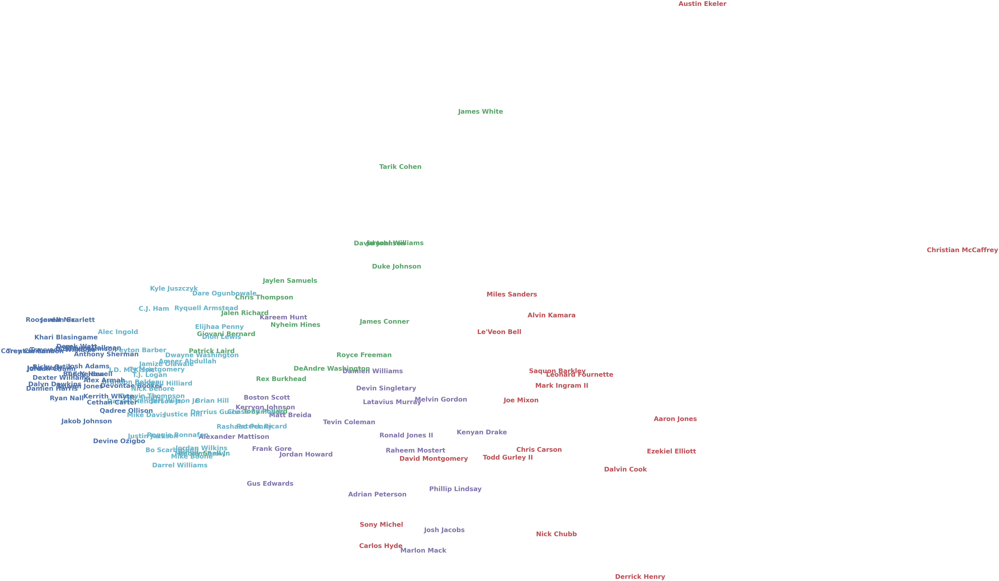

In [ ]:
# Below is a visualtion with the players associated with each cluster

# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=5, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

plt.figure(figsize=(10,10))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(rb_df.player)[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


Like before, let's take a look at the *soft clustering* solution:

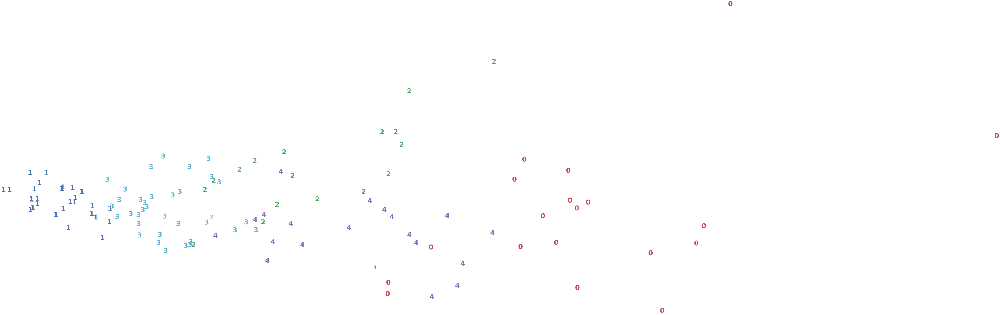

In [ ]:
probs = gmm_cluster.predict_proba(X_std)

size = 50 * probs.max(1) ** 2  # square emphasizes differences

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': size[i]}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This looks good! Like with the quarterbacks, I'm inclined to use this result to determine which players I should place on my fantasy football team.

Next, we'll take a look at our last position: Wide Receivers.

#Wide Receivers

Like running backs, wide receivers are an extremely important position in fantasy football. Though not as valuable as a single elite runningback, picking a wide receiver might be the hardest part of fantasy football. There might be multiple high performing wide receivers on any given team, and so you want to make sure that you choose a receiver that doesn't lose targets or receptions on a team that has a poor quarterback or surplus of good wide receivers. In general, the best receivers are those with a high volume of targets and receptions. 

##Importing the Data

Reading and transforming dataset in a pandas DataFrame from a csv file, along with basic information of the dataset. My third and final analysis will focus on Wide Receivers. 

In [ ]:
wr_df = pd.read_csv('https://raw.githubusercontent.com/NehemiahSolis/NFL-Fantasy-Football-Rankings/master/wr_stats_and_projections.csv')
wr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           350 non-null    int64  
 1   PLAYER NAME          350 non-null    object 
 2   TEAM                 350 non-null    object 
 3   POSITION             350 non-null    object 
 4   2019 TAR             235 non-null    float64
 5   2019 REC             235 non-null    float64
 6   2019 REC YARDS       235 non-null    float64
 7   2019 AVG REC YARDS   235 non-null    float64
 8   2019 REC TDS         235 non-null    float64
 9   2019 RUSH CAR        235 non-null    float64
 10  2019 RUSH YARDS      235 non-null    float64
 11  2019 RUSH TDS        235 non-null    float64
 12  GAMES                162 non-null    float64
 13  FPTS/GAME            162 non-null    float64
 14  2019 FPTS            235 non-null    float64
 15  2020 TAR             200 non-null    flo

As this dataset is from the same source (FantasyPros), I will perform the same exploratory data analysis and data prep as beforehand with the quarterbacks and runningbacks.

In [ ]:
wr_df.columns

Index(['Unnamed: 0', 'PLAYER NAME', 'TEAM', 'POSITION', '2019 TAR', '2019 REC',
       '2019 REC YARDS', '2019 AVG REC YARDS', '2019 REC TDS', '2019 RUSH CAR',
       '2019 RUSH YARDS', '2019 RUSH TDS', 'GAMES', 'FPTS/GAME', '2019 FPTS',
       '2020 TAR', '2020 REC', '2020 REC YARDS', '2020 AVG REC YARDS',
       '2020 REC TDS', '2020 RUSH CAR', '2020 RUSH YARDS', '2020 RUSH TDS',
       '2020 FPTS', '2020 PLAYER OUTLOOK'],
      dtype='object')

In [ ]:
wr_df.head()

,Unnamed: 0,PLAYER NAME,TEAM,POSITION,2019 TAR,2019 REC,2019 REC YARDS,2019 AVG REC YARDS,2019 REC TDS,2019 RUSH CAR,2019 RUSH YARDS,2019 RUSH TDS,GAMES,FPTS/GAME,2019 FPTS,2020 TAR,2020 REC,2020 REC YARDS,2020 AVG REC YARDS,2020 REC TDS,2020 RUSH CAR,2020 RUSH YARDS,2020 RUSH TDS,2020 FPTS,2020 PLAYER OUTLOOK
0,1,Michael Thomas,Saints,WR,185.0,149.0,1725.0,11.6,9.0,1.0,-9.0,0.0,16.0,23.412500,374.60,152.0,114.0,1351.0,11.9,9.0,0.0,0.0,0.0,301.44,Thomas is fresh off a historic 2019 season in ...
1,2,DeAndre Hopkins,Cardinals,WR,150.0,104.0,1165.0,11.2,7.0,2.0,18.0,0.0,15.0,17.902667,268.54,141.0,92.0,1140.0,12.3,8.0,4.0,23.0,0.0,255.30,Hopkins was traded to the Cardinals during the...
2,3,Julio Jones,Falcons,WR,157.0,99.0,1394.0,14.1,6.0,2.0,-3.0,0.0,15.0,18.273333,274.10,139.0,89.0,1245.0,14.0,7.0,2.0,10.0,0.0,253.95,Jones is now 31 years old but remains an elite...
3,4,Chris Godwin,Buccaneers,WR,120.0,86.0,1333.0,15.5,9.0,1.0,8.0,0.0,14.0,19.721429,276.10,131.0,88.0,1191.0,13.6,8.0,0.0,0.0,0.0,251.83,Godwin is entering his fourth NFL season and h...
4,5,Davante Adams,Packers,WR,127.0,83.0,997.0,12.0,5.0,0.0,0.0,0.0,12.0,17.725000,212.70,137.0,90.0,1149.0,12.7,7.0,0.0,0.0,0.0,249.39,Adams is back as Aaron Rodgers' unquestioned N...


Drop the predictive and irrelevant columns:

In [ ]:
wr_df.drop(columns=['2020 TAR', '2020 REC', '2020 REC YARDS', '2020 AVG REC YARDS',
                    '2020 REC TDS', '2020 RUSH CAR', '2020 RUSH YARDS','2020 RUSH TDS','2020 PLAYER OUTLOOK',
                    'TEAM','POSITION','Unnamed: 0'],inplace=True)

Rename remaining columns for ease of future use:

In [ ]:
wr_df.rename(columns={'PLAYER NAME':'player','2019 TAR':'targets','2019 REC':'receptions',
                      '2019 REC YARDS':'rec_yds','2019 AVG REC YARDS':'avg_rec_yds','2019 REC TDS':'td_rec',
                      '2019 RUSH CAR':'carries','2019 RUSH YARDS':'rush_yds','2019 RUSH TDS':'td_rush',
                      'GAMES':'no_games','FPTS/GAME':'fpts_per_game','2019 FPTS':'fpts','2020 FPTS':'proj_fpts'},inplace=True)

##Exploratory Data Analysis

Quick look at the new DataFrame:

In [ ]:
wr_df.head()

,player,targets,receptions,rec_yds,avg_rec_yds,td_rec,carries,rush_yds,td_rush,no_games,fpts_per_game,fpts,proj_fpts
0,Michael Thomas,185.0,149.0,1725.0,11.6,9.0,1.0,-9.0,0.0,16.0,23.412500,374.60,301.44
1,DeAndre Hopkins,150.0,104.0,1165.0,11.2,7.0,2.0,18.0,0.0,15.0,17.902667,268.54,255.30
2,Julio Jones,157.0,99.0,1394.0,14.1,6.0,2.0,-3.0,0.0,15.0,18.273333,274.10,253.95
3,Chris Godwin,120.0,86.0,1333.0,15.5,9.0,1.0,8.0,0.0,14.0,19.721429,276.10,251.83
4,Davante Adams,127.0,83.0,997.0,12.0,5.0,0.0,0.0,0.0,12.0,17.725000,212.70,249.39


Everything looks to be in order. Let's check out the missing values

In [ ]:
wr_df.isnull().sum()

player             0
targets          115
receptions       115
rec_yds          115
avg_rec_yds      115
td_rec           115
carries          115
rush_yds         115
td_rush          115
no_games         188
fpts_per_game    188
fpts             115
proj_fpts        150
dtype: int64

There are a lot more receivers than there were quarterbacks and runningbacks, but we will be dropping the missing values for the same reasons as before: no historical data, or not slated to play in 2020.

In [ ]:
wr_df.dropna(inplace=True)
wr_df.isnull().sum()

player           0
targets          0
receptions       0
rec_yds          0
avg_rec_yds      0
td_rec           0
carries          0
rush_yds         0
td_rush          0
no_games         0
fpts_per_game    0
fpts             0
proj_fpts        0
dtype: int64

Now let's glance at the distributive properties of the data

In [ ]:
wr_df.describe()

,targets,receptions,rec_yds,avg_rec_yds,td_rec,carries,rush_yds,td_rush,no_games,fpts_per_game,fpts,proj_fpts
count,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000
mean,55.895062,35.049383,462.222222,12.765432,2.820988,1.845679,12.345679,0.074074,12.623457,7.331566,99.975309,94.885309
std,44.847098,29.419392,395.459478,5.311178,2.779482,3.145678,25.504675,0.326006,3.973539,5.476536,83.559353,84.397036
min,0.000000,0.000000,-2.000000,-2.000000,0.000000,0.000000,-9.000000,0.000000,1.000000,-1.000000,-2.000000,0.120000
25%,14.500000,9.000000,124.750000,10.325000,0.000000,0.000000,0.000000,0.000000,10.000000,2.434286,28.675000,18.372500
50%,47.000000,30.000000,359.000000,13.000000,2.000000,1.000000,0.000000,0.000000,14.000000,6.187500,83.850000,64.940000
75%,89.750000,54.750000,728.500000,15.100000,5.000000,2.750000,14.250000,0.000000,16.000000,11.829688,160.150000,168.805000
max,185.000000,149.000000,1725.000000,38.300000,11.000000,19.000000,159.000000,3.000000,17.000000,23.412500,374.600000,301.440000


For the third time, every feature has a wide range of values, so I'll be standardizing each feature for the clustering algorithms.

Like before, let's explore the correlations between the features and receiver fantasy points scored with scatter plots.

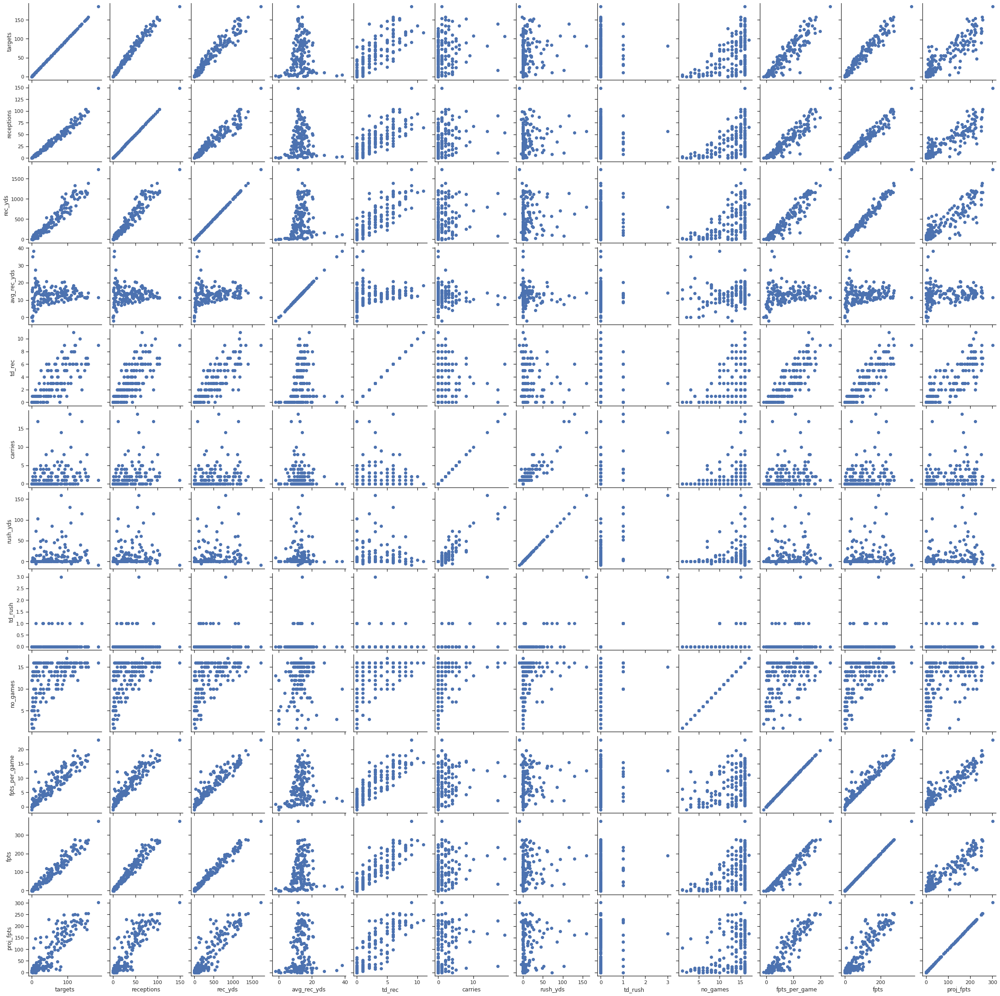

In [ ]:
sns.set(style="ticks")
g = sns.PairGrid(wr_df)
g.map(plt.scatter);

Like with the QBs and RBs, most of the features are highly correlated with the target (fantasy points scored). However, there are a couple features that look like they don't correlate very well: rushing carries, yards, and touchdowns. This makes sense as the vast majority of receivers don't ever have the opportunity to carry the ball, and those that do only do so once or twice a year. So while this stat will boost a player's fantasy potential, it happens so rarely that it is almost inconsequential for anything predictive or irrelevant for clustering. Let's look at the correlation heatmap.

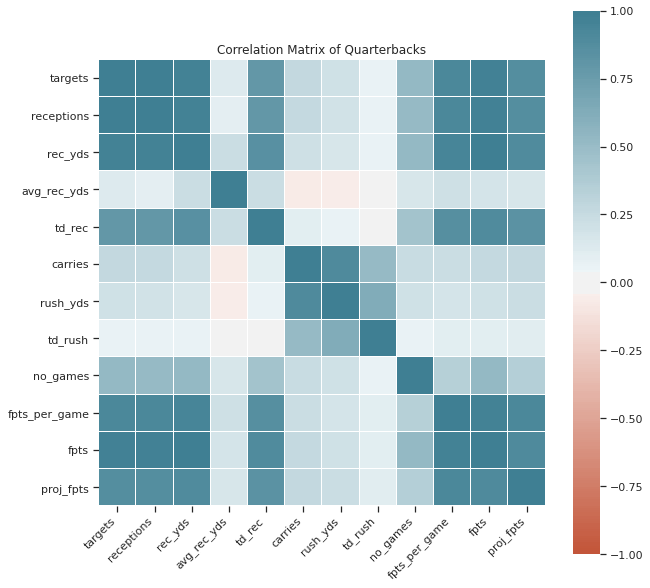

In [ ]:
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    wr_df.corr(), 
    vmin = -1, vmax=1, center=0,
    square=True,
    cmap=sns.diverging_palette(20,220,n=200), 
    linewidth=.005)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
plt.title('Correlation Matrix of Quarterbacks')
plt.show()

As we can see, the rushing stats have almost no correlation with the amount of fantasy points scored. Thus, I will drop those three features from the dataset.

In [ ]:
wr_df.drop(columns=['carries','rush_yds','td_rush'],inplace=True)

##K-Means clustering

As before, I'll be determining the optimal k-value by using the 'elbow method'.

In [ ]:
# Define the features and the outcome
X = wr_df.drop(columns=['player','proj_fpts'])
y = wr_df.proj_fpts

# Standarizing the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [ ]:
# Here we double check the shape of the features and outcome 
print(X.shape,y.shape)

(162, 8) (162,)


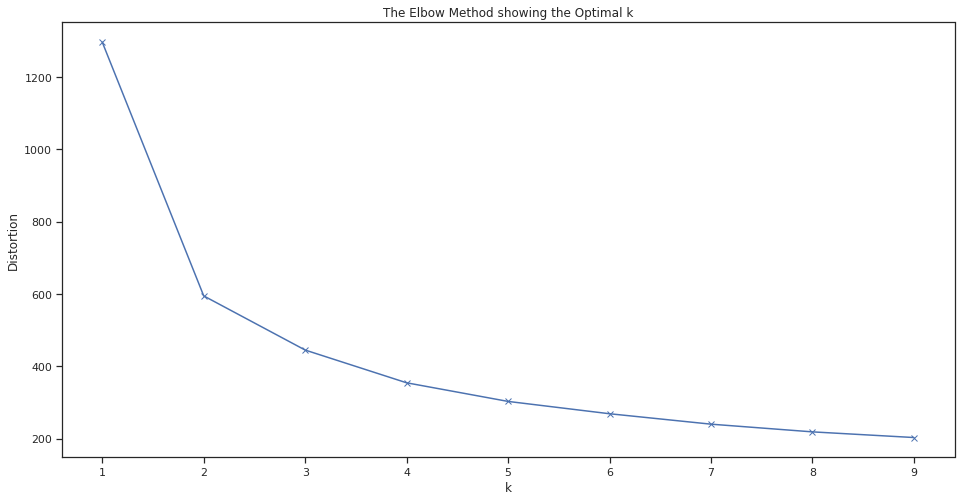

In [ ]:
# Running K-Means with a range of k
distortions = []
K = range(1,10)
for k in K:
  kmeanModel = KMeans(n_clusters=k)
  kmeanModel.fit(X_std)
  distortions.append(kmeanModel.inertia_)

# Plottinhg the distortions of K-Means
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the Optimal k')
plt.show()

Just like the past two times, the "elbow" is at k = 2. However, there is room for using k = 3, 4 and 5. As before, we will be testing different iterations of the k-means algorithm to determine which one suits our needs.

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=2, random_state=123)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

10 loops, best of 3: 22.6 ms per loop


In [ ]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

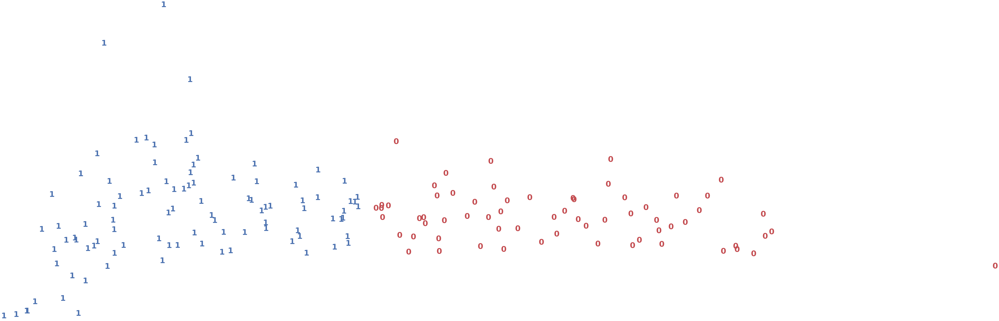

In [ ]:
# Computing the first principal components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In an earlier edition of this analysis, I had kept in the rushing stats for receivers, and got a clustering solution that did not work as well as this solution. As a result, for any future clustering analysis, performing some minor feature selection or in-depth exploratory analysis is a great idea.

Next, I will again go ahead and try out the KMeans clustering algorithm with different k-values.  

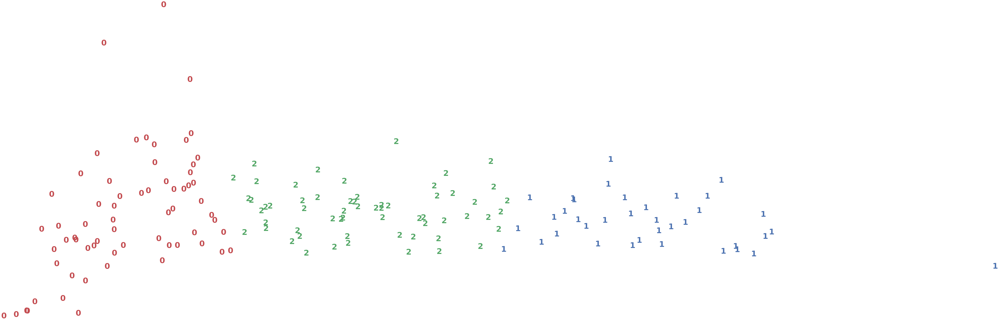

In [ ]:
# Let's try with k-means = 3, 4, 5, 6

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=3, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This looks good! The clusters are clear, and an elite tier has been formed apart from the other two tiers.

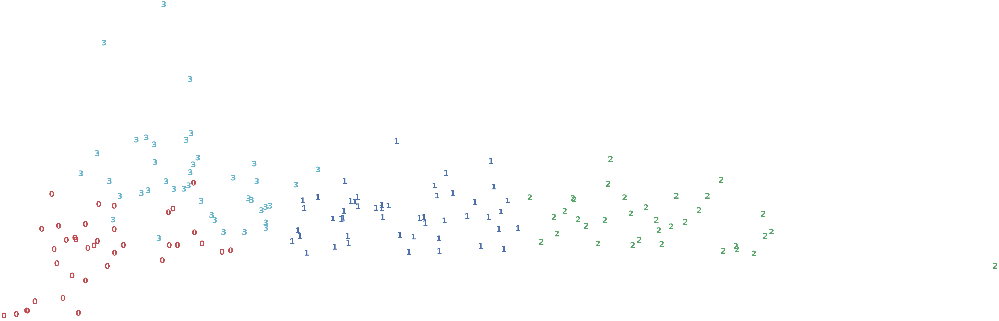

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In general, I would rather work with four clusters than with anything less. With that said, the above solution isn't bad, but there does appear to be some overlap with the two left-most clusters.

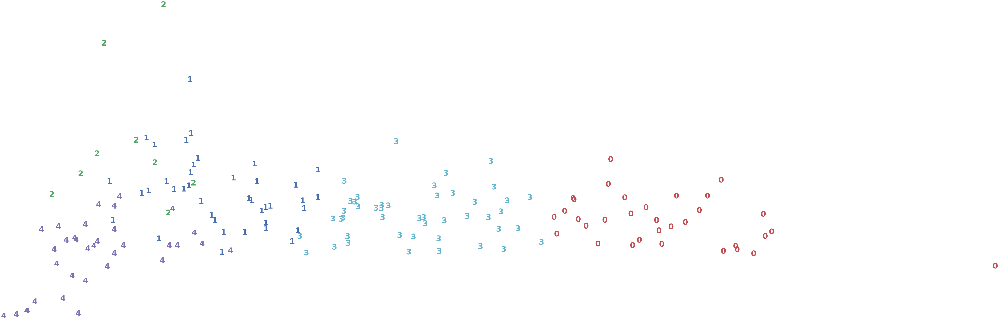

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

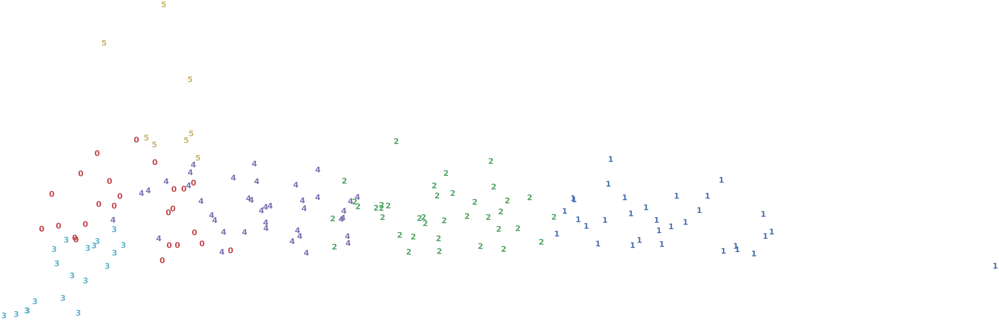

In [ ]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=6, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

With k = 5 and 6, we observe that the clustering algorithm is starting to have some serious trouble with separating classes. Thus I will proceed with four clusters, as that provides a good balance in amount of clusters, or "tiers", and correctly classified observations.

**Contingency Table**

In [ ]:
# In order to see all rows, I'll adjust the dataframe options
pd.set_option('display.max_rows', None)
# Get predicted clusters.
full_pred = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

pd.crosstab(wr_df['player'], full_pred) 

col_0,0,1,2,3
player,,,,
A.J. Brown,0,0,1,0
Adam Humphries,0,1,0,0
Adam Thielen,0,1,0,0
Albert Wilson,0,1,0,0
Alex Erickson,0,1,0,0
Allen Hurns,0,1,0,0
Allen Lazard,0,1,0,0
Allen Robinson II,0,0,1,0
Alshon Jeffery,0,1,0,0


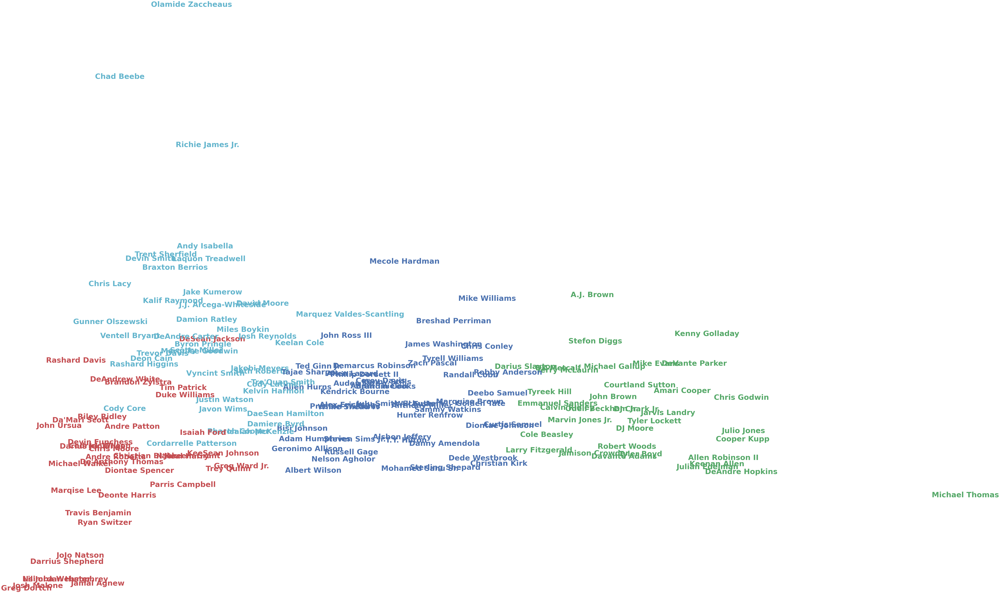

In [ ]:
# Below is a visualtion with the final chosen k-means alogirthm with k = 4
# and the players associated with each cluster

# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

plt.figure(figsize=(10,10))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(wr_df.player)[i]),
             color=colours[y_pred[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

So here we can see that the top tier and second tier of wider receivers is relatively robust. This makes sense since there are more receivers in the NFL with similar performances, so you'll find it easier to find good wide receivers for your team.

Let's now look at the silhouette scores for each k-means solution.

**Silhouette Score**

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=123)
    preds = clusterer.fit_predict(X_std)
    centers = clusterer.cluster_centers_

    score = metrics.silhouette_score(X_std, preds, metric='euclidean')
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.44578761278068324)
For n_clusters = 3, silhouette score is 0.3308708713001891)
For n_clusters = 4, silhouette score is 0.3094383832117726)
For n_clusters = 5, silhouette score is 0.3110201333525912)
For n_clusters = 6, silhouette score is 0.29745591287850975)


The scores here are not the best. However, we can see that when focusing on just WR clustering performance, the optimal k = 2 solution doesn't perform significantly better than the other solutions. Thus, I am comfortable settling with the four tier solution. The low scores also make sense when taking into account how similar WR performance is across most teams and players.

##Hierarchical clustering

Just like before, I'll only be focusing on agglomerative clustering. We'll play around with different linkage methods and plot dendrograms. With that said, let's get into it!

**Complete**

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

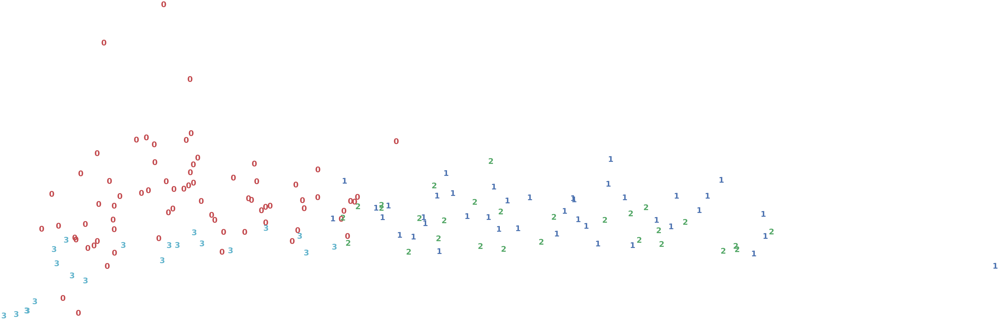

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

As you can see, agglomerative clustering has a hard time clustering.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.1285410724024036


It also has a much lower silhouette score than the other methods.

**Ward**

In [ ]:
# Defining the agglomerative clustering
# I changed the affinity to euclidean here because that is the only affinity that works with linkage = ward
agg_cluster = AgglomerativeClustering(linkage='ward', 
                                      affinity='euclidean',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

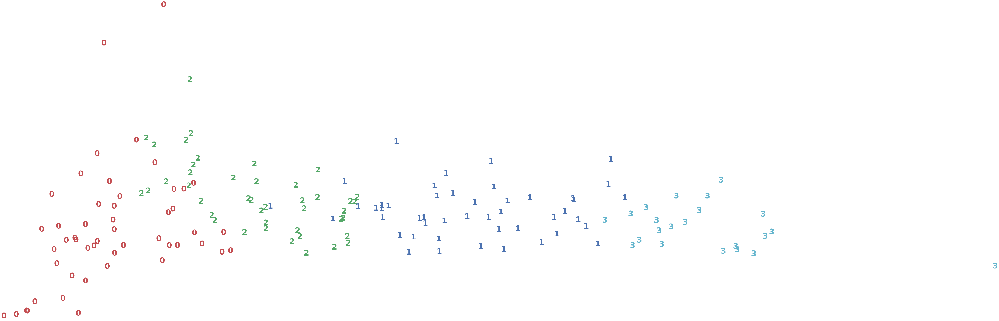

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This method actually appears to have clustered the observations very well. It even does a better job of creating a more elite top tier of wide receivers, which is a valuable tool to have in fantasy football player selection.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.26935252210057914


Even though the clustering visualization looks good, the silhouette score is a little bit lower than the other solutions.

**Average**

In [ ]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average', 
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

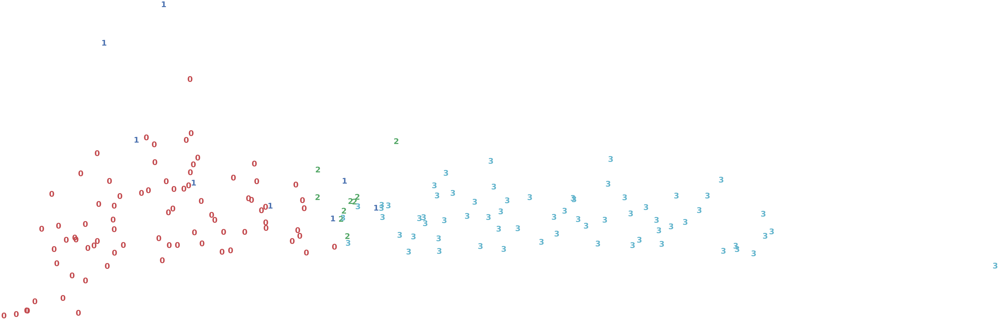

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Like with the other positions, the average linkage method performs pretty poorly.

In [ ]:
print("The silhoutte score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the Agglomerative Clustering solution: 0.139124240010922


With the silhouette score, the average method looks like it performs poorly. In conclusion, I would say that the ward linkage method performs the best. However, I still believe the k-means solution has the best clustering solution so far.

**Dendrograms**

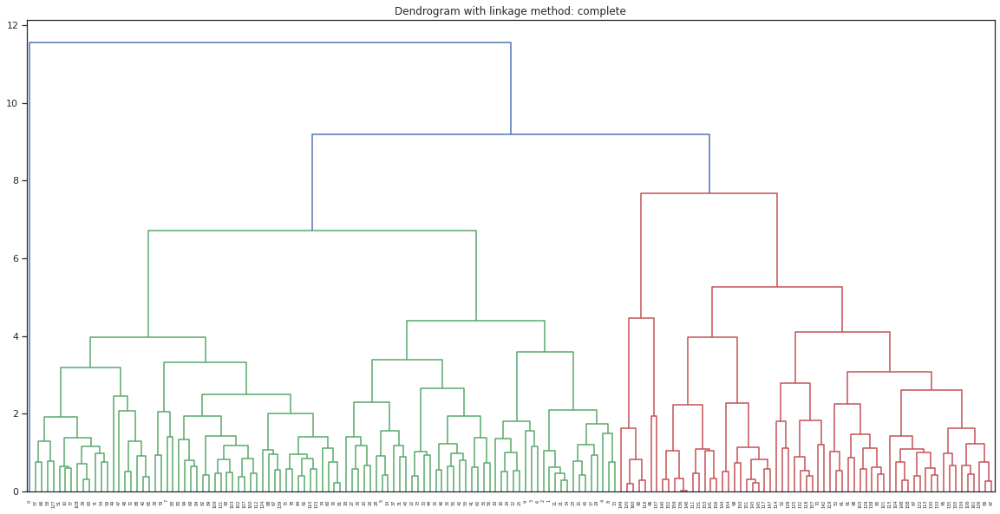

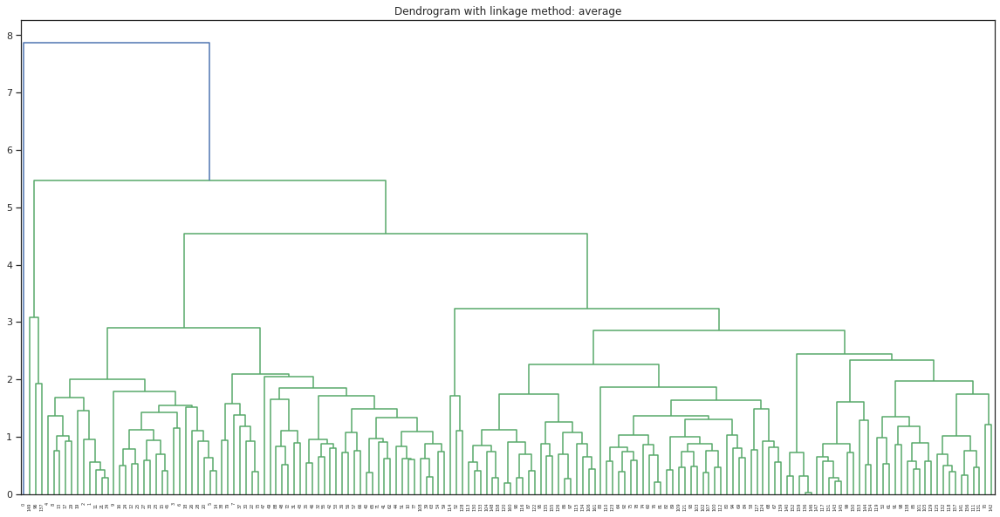

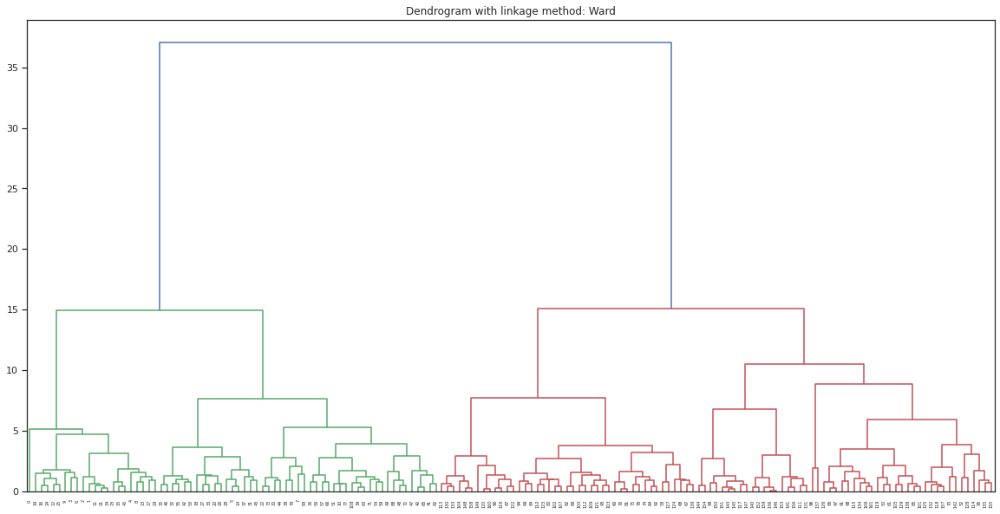

In [ ]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: complete")
dendrogram(linkage(X_std, method='complete'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: average")
dendrogram(linkage(X_std, method='average'))
plt.show()

plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: Ward")
dendrogram(linkage(X_std, method='ward'))
plt.show()

##DBSCAN Approach

The same rules as previously described apply here. Let's see how the runningbacks perform!

As we saw before, there are two hyper-parameters we can tune: epsilon ($\epsilon$) and minPts. To start, we will use an epsilon of one with min_samples = 5. We can adjust these two parameters to find the best combination.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

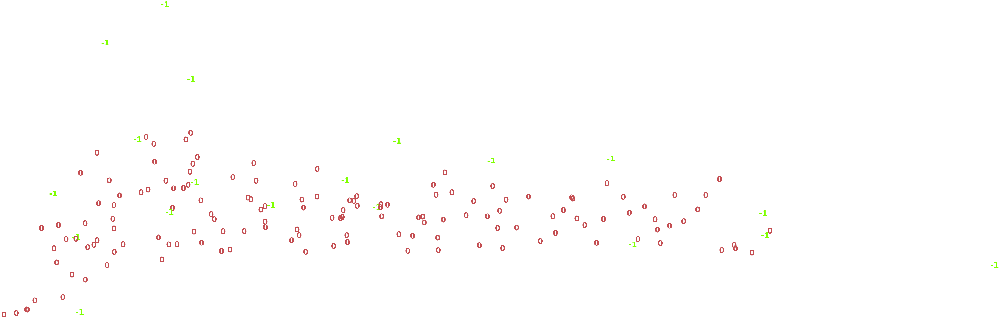

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhouette score of the DBSCAN solution with eps=1, min_samples=5: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhouette score of the DBSCAN solution with eps=1, min_samples=5: 0.21120278188214814


Just as before, the minPts is too large, as this isn't a large dataset. I'll follow this solution up with a lower of the minPts.

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=3, min_samples=2)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

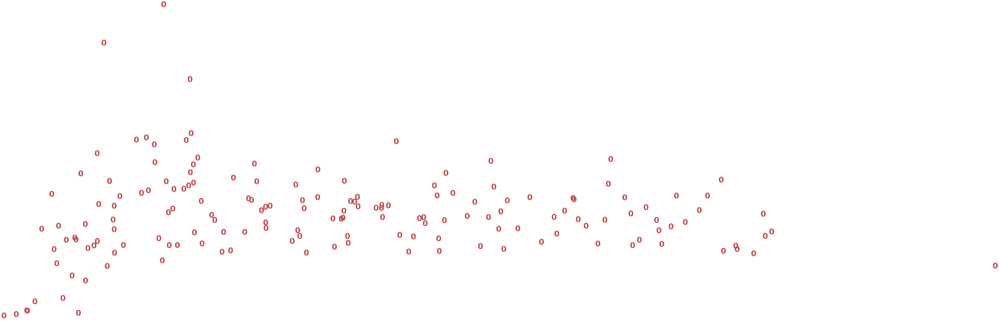

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Unfortunately, just as before, DBSCAN performs very poorly on this dataset. I would conclude that this is because it needs a robust dataset with numerous observations, and these datasets with 50-200 observations aren't enough for the model to work with.

##Gaussian Mixture Models (the GMM)

For the final model, we will look again at the GMM. This model performed well previously, so let's see if it will again.

In [ ]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=4, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

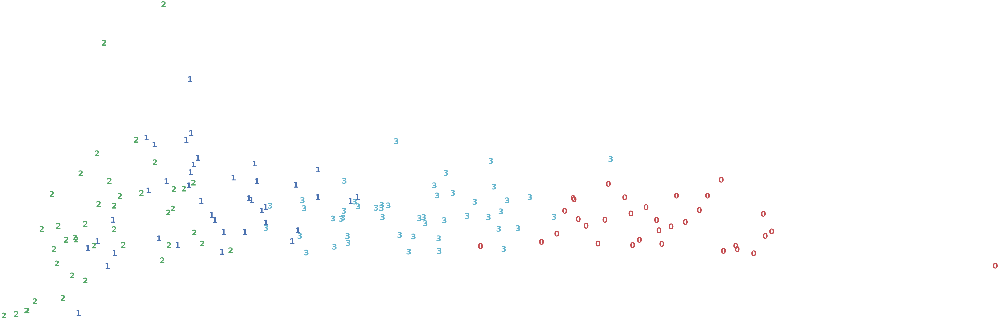

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
print("The silhoutte score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

The silhoutte score of the GMM solution: 0.2704313604702205


It looks fine, but not as clearly clustered as the k-means solution

In [ ]:
# re-labeling
pd.crosstab(wr_df['player'],clusters)

col_0,0,1,2,3
player,,,,
A.J. Brown,0,0,0,1
Adam Humphries,0,0,0,1
Adam Thielen,0,0,0,1
Albert Wilson,0,0,0,1
Alex Erickson,0,0,0,1
Allen Hurns,0,0,0,1
Allen Lazard,0,1,0,0
Allen Robinson II,1,0,0,0
Alshon Jeffery,0,0,0,1


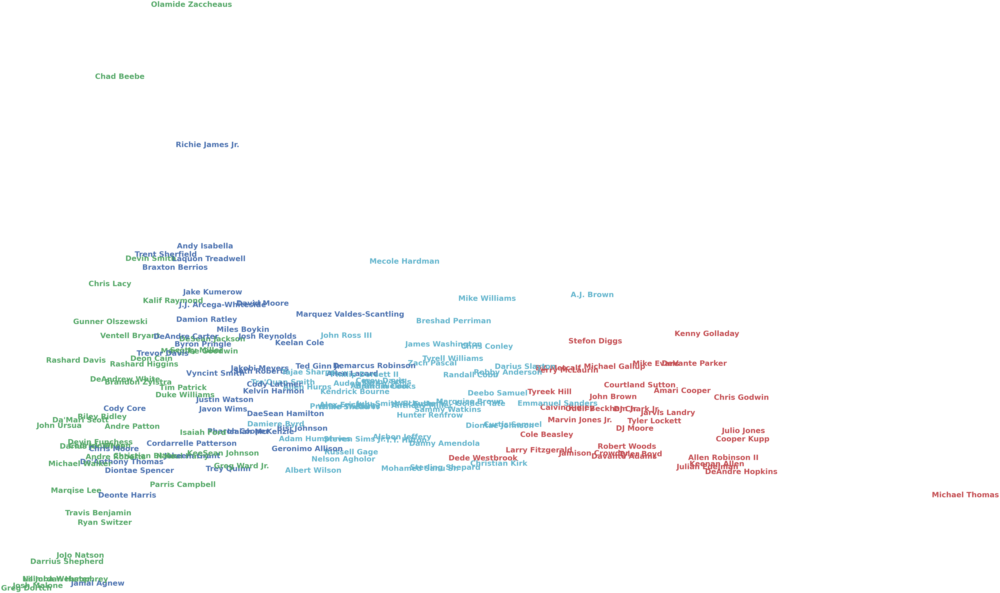

In [ ]:
# Below is a visualtion with the players associated with each cluster

# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=4, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

plt.figure(figsize=(10,10))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(np.array(wr_df.player)[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


So here, it looks like there are a little more observations that overlap with each other, but it still does an adequate job clustering the top two tiers of the best wide receivers.

Next, we'll make use of the *soft clustering* abilities that the GMM has.

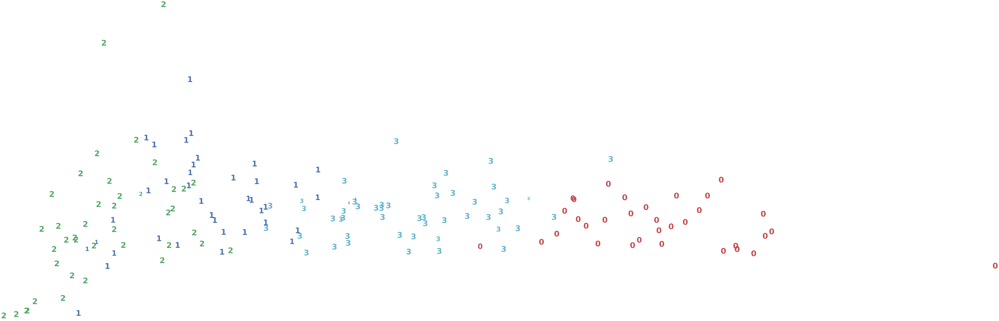

In [ ]:
probs = gmm_cluster.predict_proba(X_std)

size = 50 * probs.max(1) ** 2  # square emphasizes differences

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(clusters[i]),
             color=colours[clusters[i]],
             fontdict={'weight': 'bold', 'size': size[i]}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This solution looks like it did well with the clustering. There are a few overlaps, but overall it looks well-clustered.

#**Discussion and Recommendations**

**Model Comparison Summary**

Below is a table summarising the results of each clustering model's performance for four (or five in the case of RBs) clusters. I've also outlined the general parameters of each that performed the best in their respective sections. For hierarchical, the ward linkage method performed the best in every case, but I included every linkage method below for comparison purposes. I also only included the DBSCAN parameter that didn't result in every observation being labeled an outlier. 

The **Cluster Visualization** column is a subjective column that outlines my own personal response to the clusters each model outputed. My general guide is as follows: Very Good > Good > Adequate > Poor > Very Poor. It is essentially an opinion rating of 1-5 and should not be taken as a scientific result. However, the silhouette score is a good mathematical result, and also tends to align with the result in **Cluster Visualization**.

| POSITION | MODEL | PARAMETERS | SILHOUETTE SCORE | CLUSTER VISUALIZATION |
|----------|:------|:-----------|:-----------------|:-----|
| **Quarterback** | K-Means | k = 4 | 0.44 | Very Good |
|  | Hierarchical (Agglomerative) | linkage = complete, affinity = cosine | 0.31 | Adequate |
| | | linkage = ward, affinity = euclidean | 0.45 | Very Good |
| | | linkage = average, affinity = cosine | 0.34 | Adequate |
| | DBSCAN | epsilon = 1.6, minPts = 1 | 0.40 | Very Poor |
| | Gaussian Mixture Models | components = 4 | 0.43 | Good |
| **Runningback** | K-Means | k = 5 | 0.24 | Good |
|  | Hierarchical (Agglomerative) | linkage = complete, affinity = cosine | 0.19 | Poor |
| | | linkage = ward, affinity = euclidean | 0.22 | Adequate |
| | | linkage = average, affinity = cosine | 0.09 | Very Poor |
| | DBSCAN | epsilon = 2, minPts = 1 | 0.18 | Very Poor |
| | Gaussian Mixture Models | components = 4 | 0.15 | Adequate | 
| **Wide Receiver** | K-Means | k = 4 | 0.31 | Very Good |
|  | Hierarchical (Agglomerative) | linkage = complete, affinity = cosine | 0.13 | Very Poor |
| | | linkage = ward, affinity = euclidean | 0.26 | Very Good |
| | | linkage = average, affinity = cosine | 0.13 | Very Poor |
| | DBSCAN | epsilon = 3, minPts = 5 | N/A | Very Poor |
| | Gaussian Mixture Models | components = 4 | 0.27 | Good | 

In conclusion, I believe that I was able to find adequate clustering solutions for each of the positions I performed my analysis on. 

For *quarterbacks*, the K-Means, Hierarchical with ward linkage, and GMM produced the best clusters for splitting the players into tiers. If I were to pick one, I would choose the Hierarchical method as it has the highest silhouette score and a good cluster visualization. With an accompanying dendrogram, you'll also be able to adjust the amount of clusters according to your need. After looking into which players were clustered where, I would recommend finding a quarterback that can score both through the air and on the ground.

For *runningbacks*, the k-means produced the best visualizations and silhouette scores. Unlike the other two positions, I was able to find a good five cluster solution. After analyzing my results, my hunch was confirmed: runningbacks who receive the lion's share of the carries and are heavily involved in the passing game are the best players to have on your team.

For *wide receivers*, I will again recommend the k-means solution. The other solutions had a harder time, and this may be due to the fact that there are a lot of teams who have multiple similarly performing players. It is a saturated and over-represented position, and thus it is harder to have clean tiers. With that said, you'll be able to find a good wide receiver if you use k-means clustering, hierarchical clustering with ward linkage, or even the GMM.